In [1]:
import anndata as ad
import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import numpy as np
import matplotlib as mpl
from collections import Counter
import matplotlib.ticker as ticker
from matplotlib.ticker import FuncFormatter, PercentFormatter
import omicverse as ov
mpl.rcParams['font.family'] = 'Arial'
figPath = "figures"
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["font.size"] = 14
sc.settings.set_figure_params(dpi_save=300)

In [2]:
adata_T = sc.read_h5ad("/data/hanxue/hanxue_data/adata-xwt-annotated_T-0429.h5ad")

In [3]:
adata_T

AnnData object with n_obs × n_vars = 48293 × 41733
    obs: 'batch', 'mt_frac', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'n_genes', 'n_counts', 'leiden', 'major_type', 'molecular_type', 'leiden_harmony', 'major_type_harmony', 'minor_type', 'minor-type', 'gender', 'doublet_score', 'predicted_doublet', 'leiden-harmony-female', 'majorType-Female', 'epi-subtype', 'treat', 'leiden-1', 'annotation', 'leiden-T', 'groups', 'anno-T', 'anno-subT'
    var: 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'anno-T_colors', 'anno-subT_colors', 'annotation_colors', 'batch_colors', 'dendrogram_anno-T', 'dendrogram_annotation', 'dendrogram_leiden', 'dendrogram_leiden-1', 'gender_colors', 'hvg', 'leiden', 'leiden-1_colors', 'leiden-T_colors', 'leiden-harmony-female_colors', 'leiden_colors', 'leiden_harmony_co

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

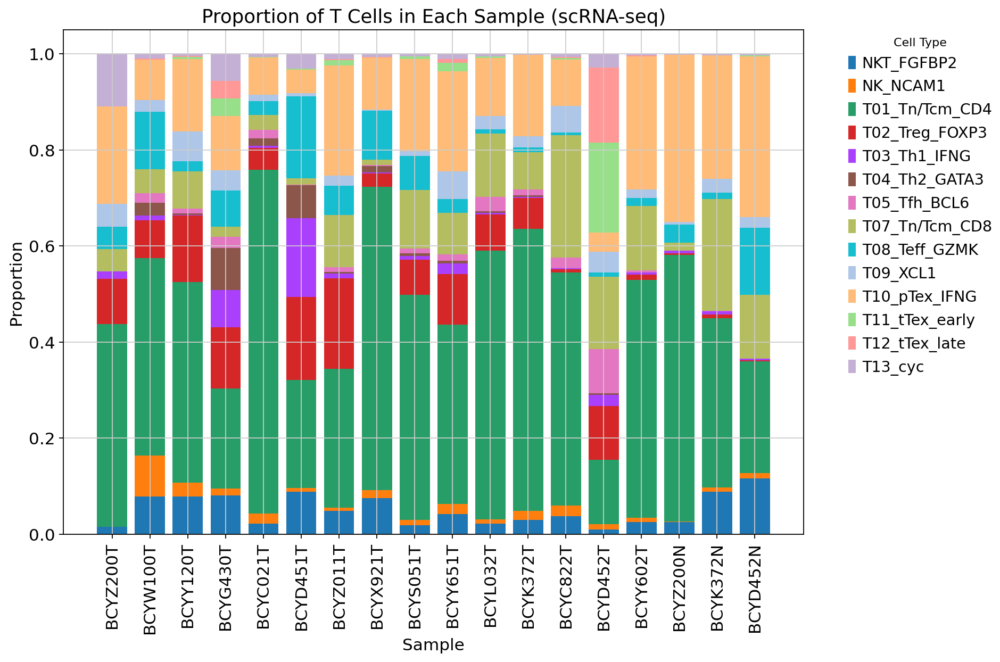

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# 1) 计数
cell_type_counts = adata_T.obs.groupby(['batch', 'anno-subT']).size().unstack(fill_value=0)

# 2) 每样本总数
sample_totals = cell_type_counts.sum(axis=1)

# 3) 映射规则
barlabels1 = ['10T','20T', '21T', '22T','1T', '2T', '8T', '9T', '15T','17T',
              '11T', '12T', '13T', '16T', '19T', '10N', '12N', '16N']
barlabels2 = ['BCYZ200T','BCYW100T', 'BCYY120T', 'BCYG430T','BCYC021T', 'BCYD451T',
              'BCYZ011T', 'BCYX921T', 'BCYS051T','BCYY651T', 'BCYL032T', 'BCYK372T',
              'BCYC822T', 'BCYD452T', 'BCYY602T', 'BCYZ200N', 'BCYK372N', 'BCYD452N']
mapping = dict(zip(barlabels1, barlabels2))

# 4) 计算比例，并把 index 从原始 batch 映射到显示名
proportions = cell_type_counts.div(sample_totals, axis=0)
# 用 mapping.get 保留未映射到的名称
proportions.index = [mapping.get(x, x) for x in proportions.index]

# 5) 期望顺序（原始名）→ 转换成“映射后的显示名”的顺序列表
desired_order_orig = ['10T','20T', '21T', '22T','1T', '2T', '8T', '9T', '15T','17T',
                      '11T', '12T', '13T', '16T', '19T', '10N', '12N', '16N']
desired_order_mapped = [mapping.get(x, x) for x in desired_order_orig]

# 6) 按“映射后的顺序”重排（只保留数据里存在的样本），并补 NaN 为 0
present_order = [s for s in desired_order_mapped if s in proportions.index]
proportions = proportions.reindex(present_order).fillna(0)

# 7) 绘图（堆叠条形图）
fig, ax = plt.subplots(figsize=(12, 8))

bottom = np.zeros(len(proportions.index))
for cell_type in proportions.columns:
    ax.bar(proportions.index, proportions[cell_type].values, bottom=bottom, label=cell_type)
    bottom += proportions[cell_type].values

ax.set_title('Proportion of T Cells in Each Sample (scRNA-seq)', fontsize=16)
ax.set_xlabel('Sample', fontsize=14)
ax.set_ylabel('Proportion', fontsize=14)
plt.xticks(rotation=90)
ax.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.savefig("figures/T-prop.svg", bbox_inches='tight')
plt.show()

In [6]:
list(adata_T.obs['anno-subT'].unique())

['T01_Tn/Tcm_CD4',
 'T07_Tn/Tcm_CD8',
 'T10_pTex_IFNG',
 'T13_cyc',
 'T02_Treg_FOXP3',
 'T04_Th2_GATA3',
 'NK_NCAM1',
 'T09_XCL1',
 'T08_Teff_GZMK',
 'T05_Tfh_BCL6',
 'T03_Th1_IFNG',
 'NKT_FGFBP2',
 'T11_tTex_early',
 'T12_tTex_late']

In [4]:
adata_CD8T = adata_T[adata_T.obs['anno-T'].isin(["CD8 & NK/NKT"]), :]
adata_CD4T = adata_T[adata_T.obs['anno-T'].isin(["CD4"]), :]
adata_cycling = adata_T[adata_T.obs['anno-T'].isin(["cycling"]), :]

In [5]:
def MergeSubAdata(adata, subAdata, obsName, subObsName):
    obs = pd.Series(list(adata.obs[obsName].copy()), index=adata.obs_names)
    subObs = pd.Series(list(subAdata.obs[subObsName].copy()), index=subAdata.obs_names)
    obs.loc[subObs.index] = subObs
    return pd.DataFrame(obs, columns=[obsName])

def marker(adata, groupby, method='wilcoxon', prefix=''):
    sc.tl.rank_genes_groups(adata, groupby = groupby, method = method)
    sc.tl.dendrogram(adata, groupby=groupby, use_rep='X_pca_harmony')
    sc.pl.rank_genes_groups_dotplot(adata, groupby = groupby, save=prefix+groupby+'.svg')
    return adata

def clu(adata, key_added="majorType-fix", n_neighbors=50, n_pcs=30, rep='X_pca_harmony', do_har=False, max_iter=20, do_scrublet=False, har_key='batch', resolution=1):
    # Computing the neighborhood graph
    if do_scrublet:
        n0 = adata.shape[0]
        print("{0} Cell number: {1}".format(key_added, n0))
        sc.external.pp.scrublet(adata)
        adata = adata[adata.obs['predicted_doublet']==False,:].copy()
        print("{0} Cells retained after scrublet, {1} cells reomved.".format(adata.shape[0], n0-adata.shape[0]))
    else:
        print("Ignoring processing doublet cells...")
    if do_har and len(adata.obs[har_key].cat.categories) > 1:
        sc.external.pp.harmony_integrate(adata, key=har_key,max_iter_harmony=max_iter)
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    else:
        print("Evaluating neighbors only...")
        sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, use_rep=rep)
    # Run UMAP
    sc.tl.umap(adata)
    sc.tl.leiden(adata, resolution=resolution, key_added=key_added)
    sc.pl.umap(adata, color=key_added, legend_fontoutline=True, palette=sc.pl.palettes.default_20, legend_loc="on data")
    return adata

In [4]:
def propPlot(age_df, barlabels1, barlabels2, ax, colors=sc.pl.palettes.default_20, xlabel='Sample ID', show_y=True, xrotate=90):
    all_df = age_df.sum(axis=1)
    age_normdf = pd.DataFrame([age_df.loc[i,:]/all_df[i] for i in barlabels1], index=barlabels1)
    age_cumdf = pd.DataFrame([np.cumsum(age_normdf.loc[i,:]) for i in barlabels1], index=barlabels1)
    norm_gdfs = age_normdf
    cum_gdfs = age_cumdf
    for i, col in enumerate(age_df.columns):
        height = norm_gdfs[col]
        starts = cum_gdfs[col] - height
        rects = ax.bar(barlabels2, height, bottom=starts, width=0.9, color=colors[i], edgecolor='white', linewidth=0.5,
                        label=col, alpha=1)
    
        # ax.bar_label(rects,age_df.loc[:, col], label_type='center', color='lightgrey', fontsize=14)
    ax.legend( bbox_to_anchor=(1, -0.3), 
              handletextpad=0.5, frameon=False,
                          borderpad=0.4,
                          columnspacing=1,
                          handlelength=0.65,
              loc='lower left', fontsize=14)
    if show_y:
        ax.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1,decimals=0))
        ax.set_ylabel('Cell proportions')
    else:
        ax.yaxis.set_visible(False)
        ax.spines.left.set_visible(False)
    ax.set_xlabel(xlabel)
    ax.set_xticks(barlabels2)
    ax.set_xticklabels(labels=barlabels2,rotation=xrotate,fontsize=13)
    ax.spines.top.set_visible(False)
    ax.spines.right.set_visible(False)
 # 关闭背景网格线
    ax.grid(False)  

2025-09-17 07:55:31,738 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Ignoring processing doublet cells...


2025-09-17 07:55:35,607 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-09-17 07:55:35,790 - harmonypy - INFO - Iteration 1 of 20
2025-09-17 07:55:46,093 - harmonypy - INFO - Iteration 2 of 20
2025-09-17 07:55:56,406 - harmonypy - INFO - Converged after 2 iterations
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font fam

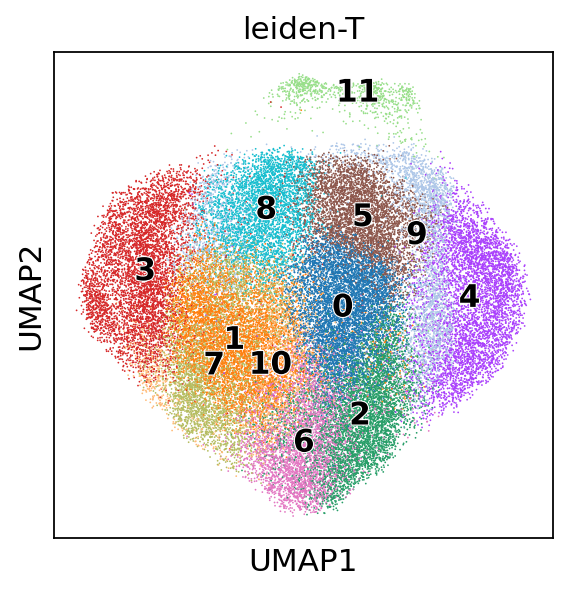

In [6]:
adata_T = clu(adata_T, key_added='leiden-T', do_har=True)

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

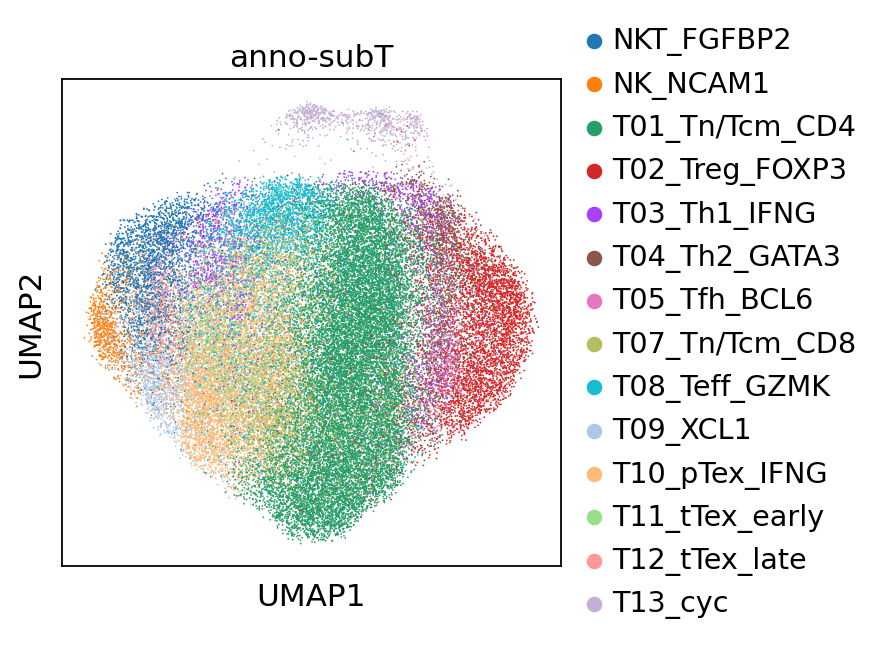

In [17]:
sc.pl.umap(adata_T, color="anno-subT", palette=sc.pl.palettes.default_20, save='-T-total.svg')

In [13]:
sc.tl.rank_genes_groups(adata_T, groupby='anno-subT')
sc.tl.dendrogram(adata_T, groupby='anno-subT')

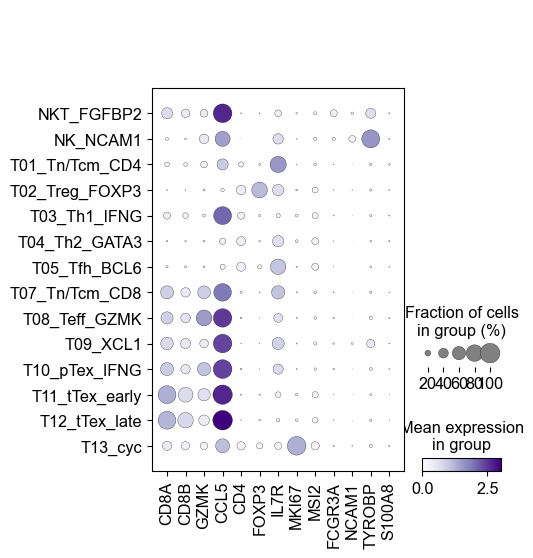

In [15]:
fig, ax = plt.subplots(1,1,figsize=(4.5,6))
sc.pl.dotplot(adata_T, groupby='anno-subT',  cmap='Purples', var_names=[
  'CD8A', 'CD8B', 'GZMK', 'CCL5','CD4', "FOXP3",'IL7R','MKI67','MSI2', 'FCGR3A','NCAM1', 'TYROBP','S100A8'], ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=8)
fig.savefig("figures/T/Tmarkers.svg", bbox_inches='tight')

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

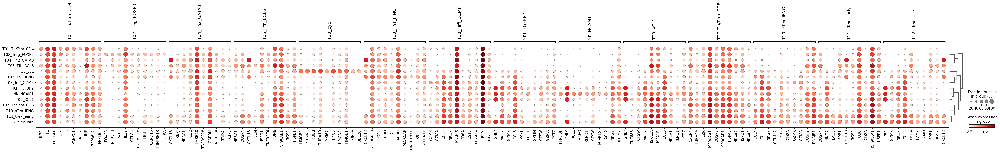

In [7]:
sc.tl.rank_genes_groups(adata_T, groupby = "anno-subT", method = "wilcoxon")
sc.tl.dendrogram(adata_T, groupby="anno-subT", use_rep='X_pca_harmony')
sc.pl.rank_genes_groups_dotplot(adata_T, groupby = "anno-subT")

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

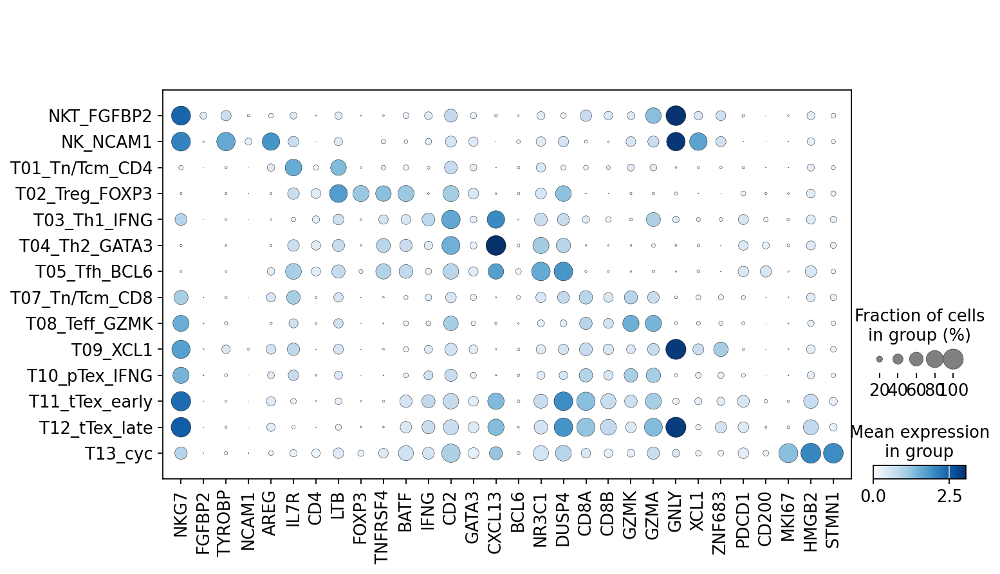

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

In [16]:
fig, ax = plt.subplots(1,1,figsize=(10,6))
sc.pl.dotplot(adata_T, groupby='anno-subT',  cmap='Blues', var_names=[
    'NKG7','FGFBP2',
    'TYROBP','NCAM1','AREG',
    'IL7R', 'CD4','LTB', 
    'FOXP3', 'TNFRSF4', 'BATF',
    'IFNG', 'CD2',
    'GATA3', 'CXCL13', 
    'BCL6', 'NR3C1', 'DUSP4',
    'CD8A', 'CD8B',
    'GZMK', 'GZMA',
    'GNLY',  'XCL1', 'ZNF683', 
    'PDCD1', 'CD200',
    'MKI67', 'HMGB2', 'STMN1',
    ], ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), fontsize=8)
fig.savefig("figures/Tvariables.svg", bbox_inches='tight')

In [ ]:
cytogenes = ['PRF1', 'GZMA', 'GZMB', 'GNLY', 'NKG7', 'GZMK', 'IFNG', 'TNFAIP3', 'IL2RA', 'GZMH', 'ITGAL', 'ITGB2']
exgenes = ['PDCD1', 'HAVCR2', 'TIGIT', 'CTLA4', 'LAG3']
sc.tl.score_genes(adata_T, gene_list=exgenes, score_name='exhaustion')
sc.tl.score_genes(adata_T, gene_list=cytogenes, score_name='cytotoxicity')

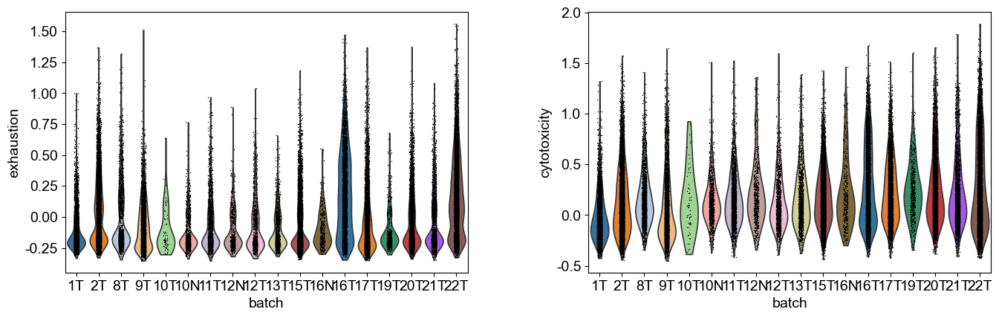

In [21]:
sc.pl.violin(adata_T, keys=['exhaustion','cytotoxicity'], groupby='batch')

2025-09-17 08:01:35,074 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Ignoring processing doublet cells...


2025-09-17 08:01:37,781 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-09-17 08:01:37,837 - harmonypy - INFO - Iteration 1 of 20
2025-09-17 08:01:41,403 - harmonypy - INFO - Iteration 2 of 20
2025-09-17 08:01:44,971 - harmonypy - INFO - Iteration 3 of 20
2025-09-17 08:01:48,584 - harmonypy - INFO - Converged after 3 iterations
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not fou

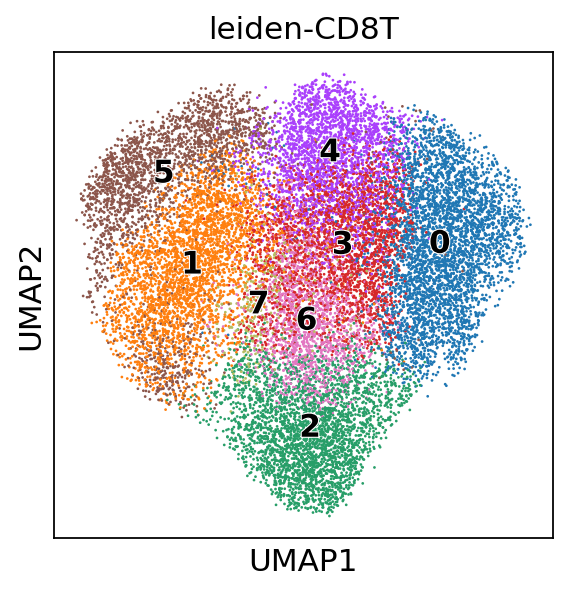

In [7]:
adata_CD8T = clu(adata_CD8T, key_added='leiden-CD8T', do_har=True)

2025-09-17 08:02:56,829 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Ignoring processing doublet cells...


2025-09-17 08:02:59,861 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-09-17 08:02:59,943 - harmonypy - INFO - Iteration 1 of 20
2025-09-17 08:03:05,314 - harmonypy - INFO - Iteration 2 of 20
2025-09-17 08:03:10,709 - harmonypy - INFO - Converged after 2 iterations
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font fam

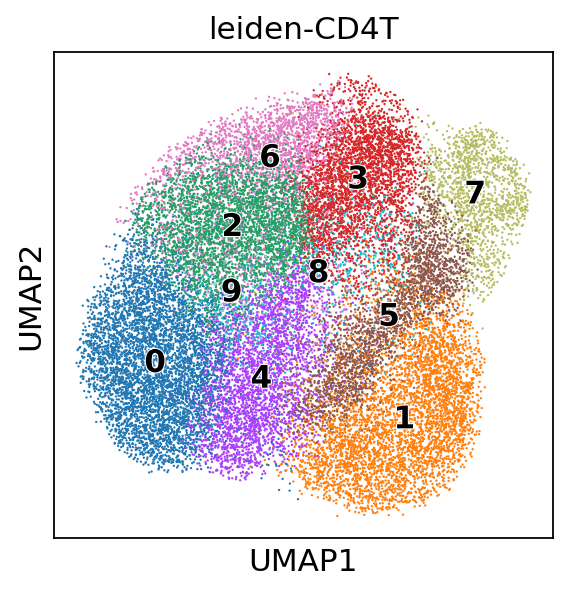

In [8]:
adata_CD4T = clu(adata_CD4T, key_added='leiden-CD4T', do_har=True)

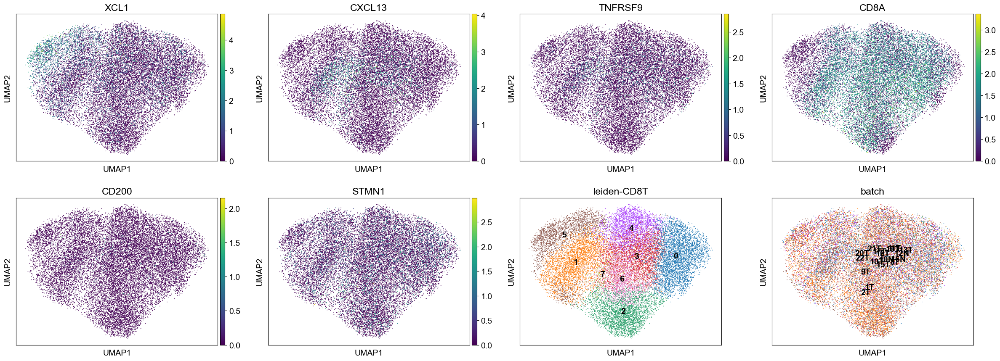

In [24]:
sc.pl.umap(adata_CD8T, color=['XCL1', 'CXCL13', 'TNFRSF9', 'CD8A', 'CD200', 'STMN1','leiden-CD8T', 'batch'], legend_loc='on data')

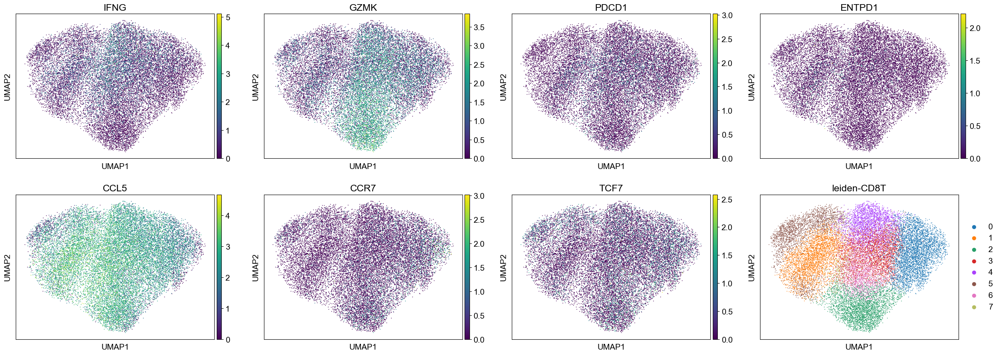

In [25]:
sc.pl.umap(adata_CD8T, color=['IFNG', 'GZMK', 'PDCD1', 'ENTPD1', 'CCL5', 'CCR7','TCF7','leiden-CD8T'])

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

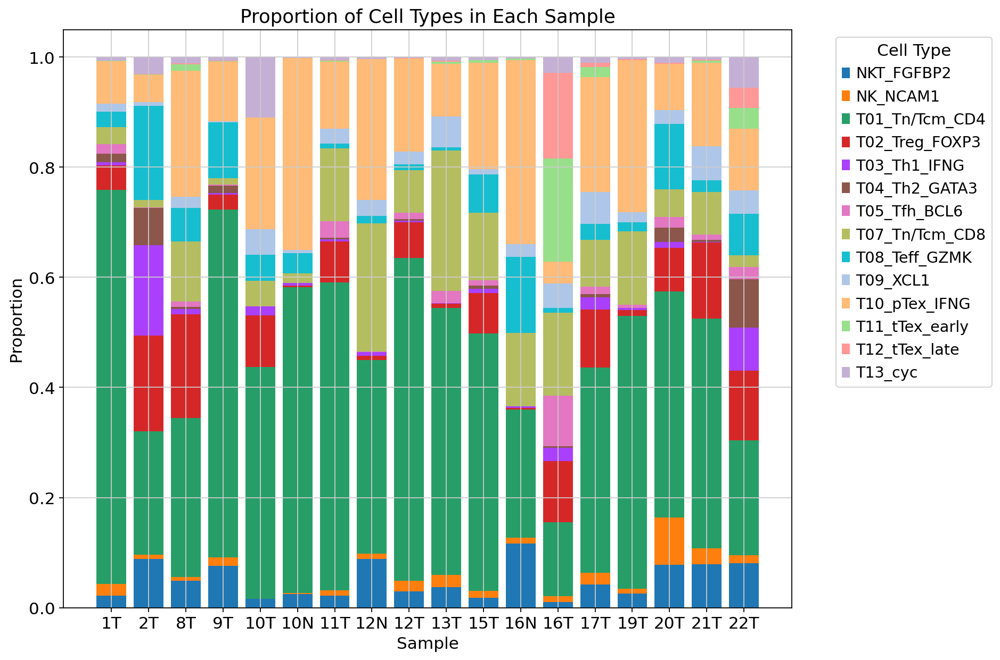

In [6]:
# 1. 计算每个样本中每种细胞类型的数量
cell_type_counts = adata_T.obs.groupby(['batch', 'anno-subT']).size().unstack(fill_value=0)

# 2. 计算每个样本的总细胞数
sample_totals = cell_type_counts.sum(axis=1)

# 3. 计算每种细胞类型在每个样本中的占比
proportions = cell_type_counts.div(sample_totals, axis=0)

# 4. 绘制堆叠条形图
fig, ax = plt.subplots(figsize=(12, 8))

# 遍历每个细胞类型，逐层堆叠
bottom = np.zeros(len(cell_type_counts.index))  # 初始化底部高度
for cell_type in proportions.columns:
    ax.bar(proportions.index, proportions[cell_type], bottom=bottom, label=cell_type)
    bottom += proportions[cell_type]  # 更新底部高度

# 添加标题和标签
ax.set_title('Proportion of Cell Types in Each Sample', fontsize=16)
ax.set_xlabel('Sample', fontsize=14)
ax.set_ylabel('Proportion', fontsize=14)
ax.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')

# 显示图形
plt.tight_layout()
plt.show()

In [78]:
adata_ab = adata_CD8T[adata_CD8T.obs['treat'].isin(['After', 'Before']), :]

In [79]:
from collections import Counter
def propByCell(adata, group, key, batch):
    groups = adata.obs[batch][adata.obs[group]==key]
    props = Counter(groups)
    all = sum(props.values())
    for item in props.keys():
        props[item] = (props[item] / all)
    return props

def propByBatch(adata, group, key, batch):
    groups = adata.obs[batch][adata.obs[group]==key]
    props = Counter(groups)
    for item in props.keys():
        props[item] = (props[item] / sum(adata.obs[batch]==item))
    return props
propByBatch(adata_ab, 'anno-subT', 'T11_tTex_early', 'batch')

Counter({'16T': 0.3081998114985862,
         '17T': 0.03829583532790809,
         '8T': 0.023784901758014478,
         '15T': 0.011273957158962795,
         '13T': 0.008077544426494346,
         '11T': 0.007122507122507123,
         '1T': 0.0064,
         '2T': 0.004631773969430292,
         '9T': 0.0019120458891013384})

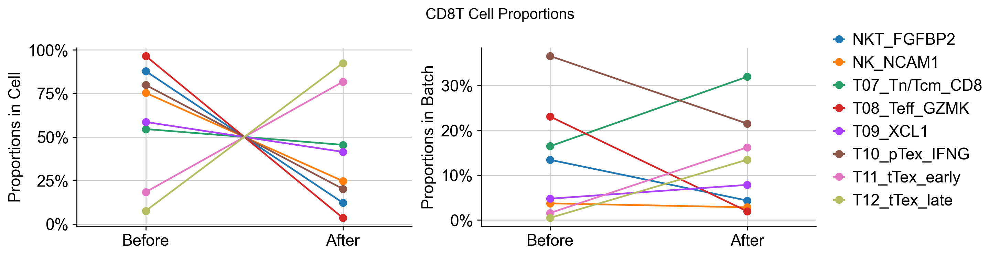

In [80]:
import matplotlib.pyplot as plt
from matplotlib import ticker
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["axes.unicode_minus"] = False
plt.rcParams["font.size"] = 13

def propPlot(adata, ax, group, keys, diff, mode='Cell', showLegend=True):
    if mode=='Cell':
        fn=propByCell
    else:
        fn=propByBatch
    for key in keys:
        props = fn(adata, group, key, diff)
        y=list(props.values())
        x=list(props.keys())
        ax.plot(x, y, marker='o', label=key)
        bar=list(props.keys())
    ax.yaxis.set_major_formatter(ticker.PercentFormatter(xmax=1,decimals=0))
    ax.set_ylabel('Proportions in {}'.format(mode))
    ax.spines.top.set_visible(False)
    ax.spines.right.set_visible(False)
    ax.set_xlim(-0.35,1.35)
    if showLegend:
        ax.legend( bbox_to_anchor=(1, 0), 
              handletextpad=0.5, frameon=False,
                          borderpad=0.6,
                          columnspacing=1.3,
                          handlelength=0.65,
              loc='lower left', fontsize=14)
fig, ax = plt.subplots(nrows=1, ncols=2,figsize=(12, 3),constrained_layout=True)
propPlot(adata_ab, ax[0], 'anno-subT', 
         ['NKT_FGFBP2', 'NK_NCAM1', 'T07_Tn/Tcm_CD8', 'T08_Teff_GZMK', 'T09_XCL1', 'T10_pTex_IFNG', 'T11_tTex_early','T12_tTex_late'], 'treat', showLegend=False)
propPlot(adata_ab, ax[1], 'anno-subT', ['NKT_FGFBP2', 'NK_NCAM1', 'T07_Tn/Tcm_CD8', 'T08_Teff_GZMK', 'T09_XCL1', 'T10_pTex_IFNG', 'T11_tTex_early','T12_tTex_late'], 'treat', mode="Batch")
fig.suptitle("CD8T Cell Proportions", fontsize=13)
fig.show()
fig.savefig("figures/CD8T-Cell-prop-plot.svg", bbox_inches='tight')

[Text(0, 0, 'NKT_FGFBP2'),
 Text(1, 0, 'NK_NCAM1'),
 Text(2, 0, 'T07_Tn/Tcm_CD8'),
 Text(3, 0, 'T08_Teff_GZMK'),
 Text(4, 0, 'T09_XCL1'),
 Text(5, 0, 'T10_pTex_IFNG'),
 Text(6, 0, 'T11_tTex_early'),
 Text(7, 0, 'T12_tTex_late')]

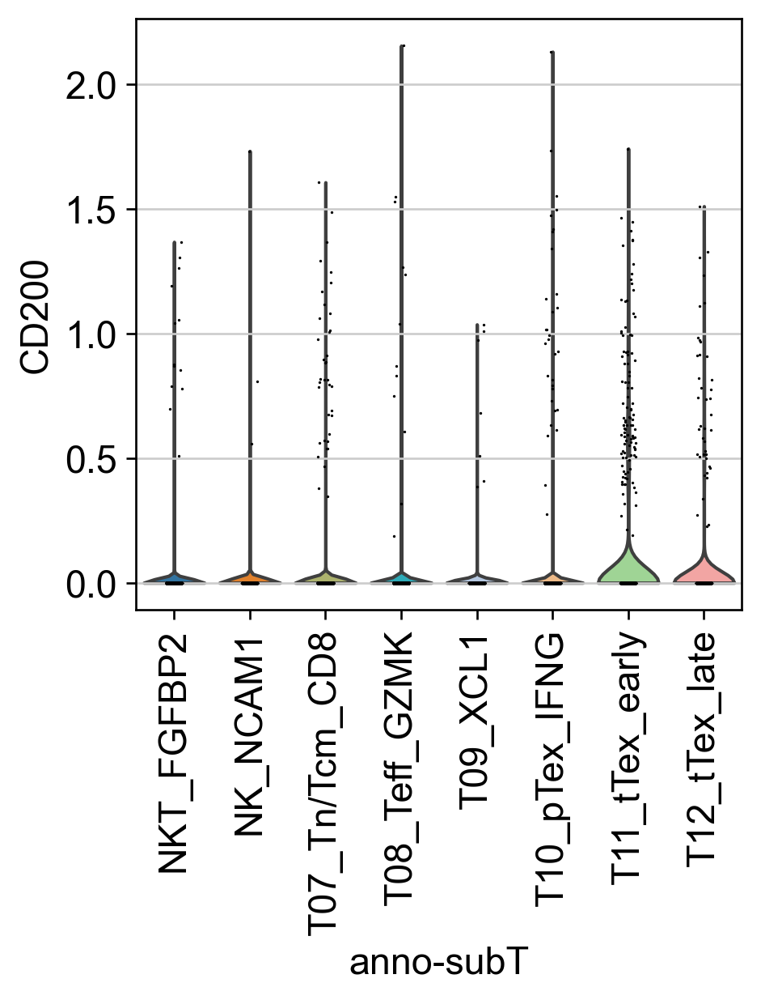

In [22]:
fig, ax = plt.subplots(figsize=(4, 4))
sc.pl.violin(adata_CD8T, keys=['CD200'], groupby='anno-subT', ax=ax, show=False)
ax.set_xticklabels(adata_CD8T.obs['anno-subT'].cat.categories, rotation=90)

[Text(0, 0, 'NKT_FGFBP2'),
 Text(1, 0, 'NK_NCAM1'),
 Text(2, 0, 'T07_Tn/Tcm_CD8'),
 Text(3, 0, 'T08_Teff_GZMK'),
 Text(4, 0, 'T09_XCL1'),
 Text(5, 0, 'T10_pTex_IFNG'),
 Text(6, 0, 'T11_tTex_early'),
 Text(7, 0, 'T12_tTex_late')]

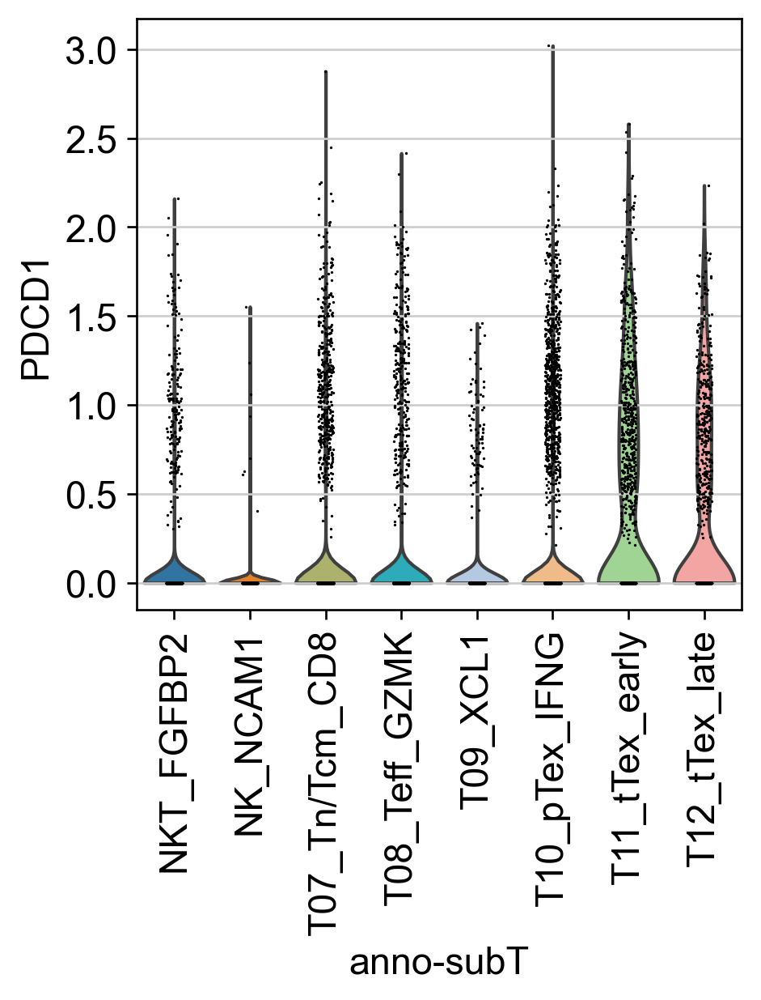

In [24]:
fig, ax = plt.subplots(figsize=(4, 4))
sc.pl.violin(adata_CD8T, keys=['PDCD1'], groupby='anno-subT', ax=ax, show=False)
ax.set_xticklabels(adata_CD8T.obs['anno-subT'].cat.categories, rotation=90)

[Text(0, 0, 'After'),
 Text(1, 0, 'Before'),
 Text(2, 0, 'Normal'),
 Text(3, 0, 'W/O Treat')]

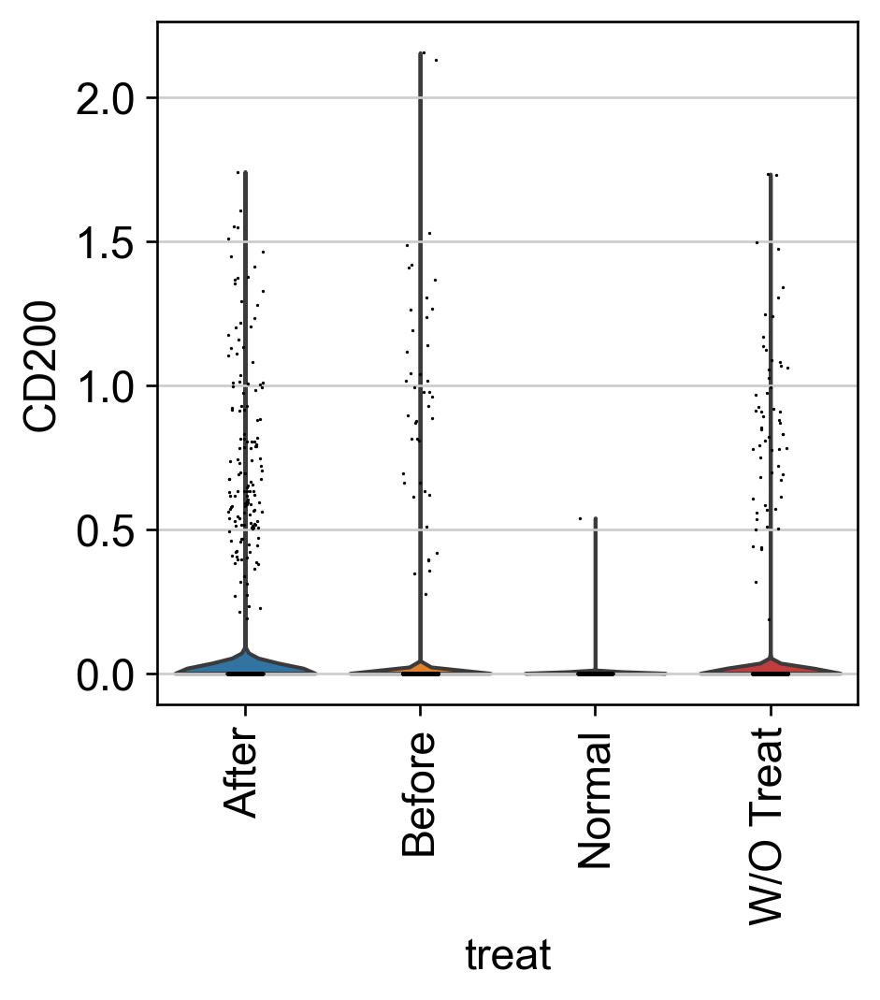

In [23]:
fig, ax = plt.subplots(figsize=(4, 4))
sc.pl.violin(adata_CD8T, keys=['CD200'], groupby='treat', ax=ax, show=False)
ax.set_xticklabels(adata_CD8T.obs['treat'].cat.categories, rotation=90)

[Text(0, 0, 'After'),
 Text(1, 0, 'Before'),
 Text(2, 0, 'Normal'),
 Text(3, 0, 'W/O Treat')]

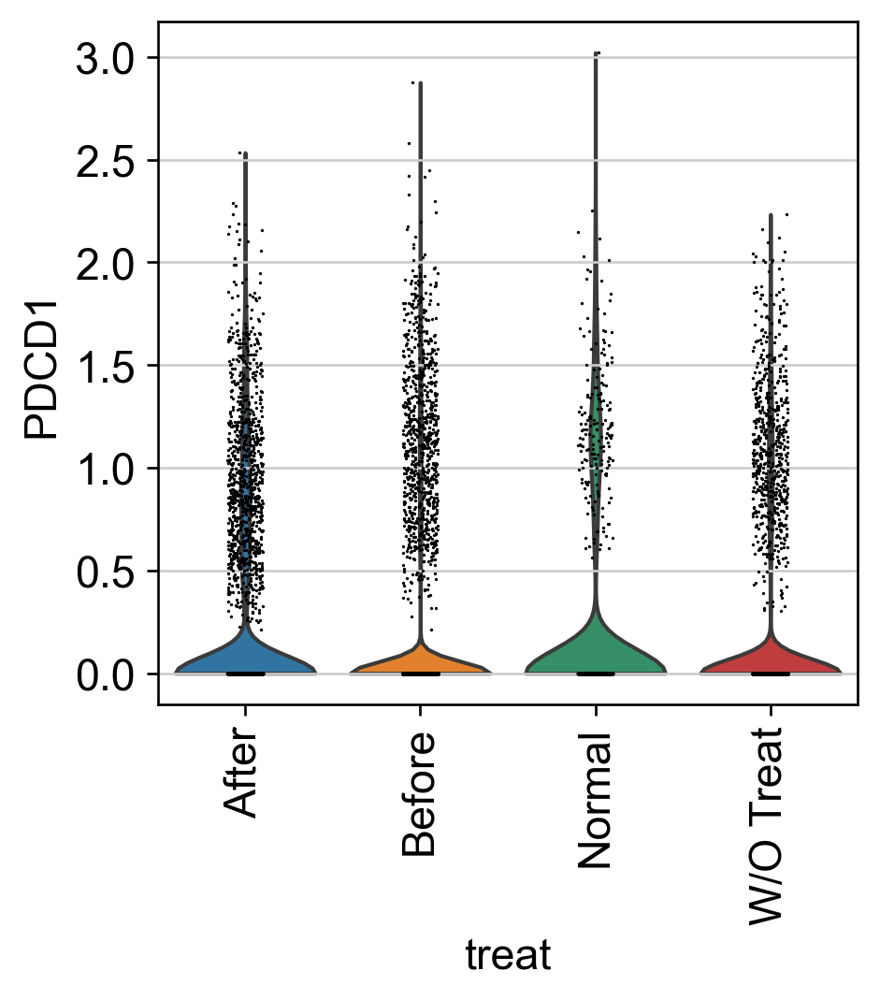

In [26]:
fig, ax = plt.subplots(figsize=(4, 4))
sc.pl.violin(adata_CD8T, keys=['PDCD1'], groupby='treat', ax=ax, show=False)
ax.set_xticklabels(adata_CD8T.obs['treat'].cat.categories, rotation=90)

In [66]:
adata_tex = adata_CD8T[adata_CD8T.obs['anno-subT'].isin(['T11_tTex_early', 'T12_tTex_late']), :]

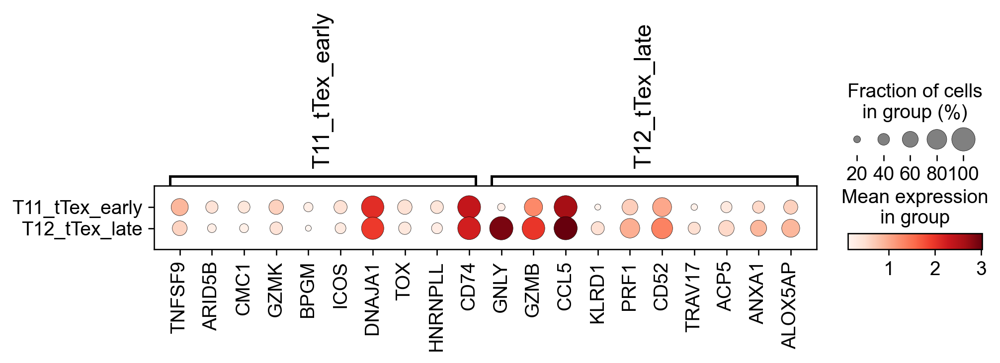

In [67]:
adata_tex = marker(adata_tex, groupby='anno-subT')

#### 差异基因

In [ ]:
# adata_T = adata_T[~adata_T.obs['batch'].isin(['16T']), :]
# adata_T.obs['batch'].unique()

['1T', '2T', '8T', '9T', '10T', ..., '17T', '19T', '20T', '21T', '22T']
Length: 17
Categories (17, object): ['1T', '2T', '8T', '9T', ..., '19T', '20T', '21T', '22T']

In [17]:
# 选用高变基因
adata_T_highvar = adata_T[:, adata_T.var['highly_variable']].copy()
dds = ov.bulk.pyDEG(adata_T_highvar.to_df().T)
dds.drop_duplicates_index()
better_groups = adata_T_highvar.obs[adata_T_highvar.obs['treat']=='After'].index.tolist() # 实验组
worse_groups = adata_T_highvar.obs[adata_T_highvar.obs['treat']=='Before'].index.tolist() # 对照组
deg_result = dds.deg_analysis(better_groups, worse_groups, method='ttest')
dds.foldchange_set(fc_threshold=-1,
                   pval_threshold=0.05,
                   logp_max=10)

⚙️ You are using ttest method for differential expression analysis.
⏰ Start to calculate qvalue...
✅ Differential expression analysis completed.
... Fold change threshold: 2.752789258956909


In [13]:
deg_result_filter = deg_result[deg_result['sig'] != 'normal']
deg_result_filter

,pvalue,qvalue,FoldChange,MaxBaseMean,BaseMean,log2(BaseMean),log2FC,abs(log2FC),size,-log(pvalue),-log(qvalue),sig
name,,,,,,,,,,,,
STAT1,0.000000,0.000000,0.335126,0.863899,0.576705,-0.794094,-1.577224,1.577224,0.033513,inf,10.000000,down
IFI6,0.000000,0.000000,0.407065,0.818627,0.575929,-0.796037,-1.296669,1.296669,0.040706,inf,10.000000,down
MX1,0.000000,0.000000,0.357260,0.787249,0.534249,-0.904417,-1.484955,1.484955,0.035726,inf,10.000000,down
GPR183,0.000000,0.000000,2.490469,0.527576,0.369705,-1.435552,1.316418,1.316418,0.249047,inf,10.000000,up
KDM6B,0.000000,0.000000,2.177171,0.624830,0.455909,-1.133181,1.122454,1.122454,0.217717,inf,10.000000,up
...,...,...,...,...,...,...,...,...,...,...,...,...
ADAMTSL1,0.012182,0.028264,12.818654,0.000805,0.000431,-11.180122,3.680173,3.680173,1.281865,1.914291,1.548768,up
ENSG00000286895,0.020633,0.046575,65.587517,0.000406,0.000203,-12.266432,6.035349,6.035349,6.558752,1.685442,1.331845,up
BRINP2,0.014285,0.033065,0.006886,0.000907,0.000453,-11.107392,-7.182190,7.182190,0.000689,1.845128,1.480634,down


In [18]:
deg_result_filter.to_excel("T_deg.xlsx", index=True)

In [14]:
# After vs WOTreat
# 上调基因（新辅助治疗组 ↑，更值得关注的T细胞相关/互作基因）
up_genes = [
    "GPR183",   # 亦称EBI2；定位/归巢受体，影响T细胞在二级淋巴器官与肿瘤微环境中的空间分布
    "CRTAM",    # 活化T细胞免疫黏附分子；与黏附/细胞毒功能相关，提示活化/组织驻留样表型
    "KDM6B",    # 表观遗传调控因子（H3K27me3去甲基化酶）；参与T细胞活化与命运决定
    "CDKN1C",   # 细胞周期抑制因子；上调提示活化后增殖/分化的“刹车”调节
    "SPRY1",    # RTK信号负调控因子；限制过度增殖/迁移，影响活化阈值
    "SOX4",     # 转录因子；调控迁移/存活与组织适应，部分研究与组织驻留样T细胞相关
    "VCAM1",    # 黏附分子；促进T细胞与内皮/基质的相互作用，利于浸润与驻留
    "METRNL",   # 分泌因子；与炎症调节/组织修复相关，可能塑造免疫微环境
    "PER1",     # 昼夜节律基因；节律-免疫耦联，影响活化/迁移时间窗
    "HES4",     # Notch通路相关转录因子；参与活化后分化轨迹
    "IGFBP7",   # 生长因子结合蛋白；与血管-免疫互作/基质重塑相关
    "TRBV24-1", # TCR β链可变区基因；提示特定克隆扩增/抗原选择压力
    "SELE",     # E-选择素；内皮黏附分子，上调利于淋巴细胞滚动/黏附与渗出
    "C11orf96", # 炎症-应激相关基因（功能未完全注释）；与免疫活化表型相关线索
    # "APOD",     # 脂质转运相关；与组织应激/修复及免疫调节相关
]

# 下调基因（新辅助治疗组 ↓，疗法后显著被抑制的T细胞程序/通路）
down_genes = [
    "STAT1",  # IFN-γ/IFN-I信号主转录因子；其下降提示干扰素应答被抑制
    "IFIT3",  # 干扰素刺激基因（ISG）；抗病毒/放大IFN信号
    "IFIT2",  # ISG；抑制翻译/抗病毒
    "IFIT1",  # ISG；抗病毒，限制蛋白合成
    "IFI6",   # ISG；细胞应激与凋亡调控
    "IFI44L", # ISG；抗病毒程序
    "IFI27",  # ISG；应激/凋亡相关
    "MX1",    # ISG；抗病毒GTP酶
    "RSAD2",  # 亦称Viperin；强ISG，抑制病毒复制/代谢重编程
    # "CXCL10", # Th1趋化因子；招募CXCR3+效应T细胞，其下降提示浸润/募集信号减弱
    "KIR2DL4",# NK/T细胞受体；与细胞毒功能/免疫调控相关
    "CISH",   # 细胞因子信号的负调控因子；下降可能反映负反馈减弱、活化阈值改变
    "APOE",   # 脂质/免疫代谢枢纽；与抗原提呈与免疫调控相关，下降提示代谢-免疫耦联改变
]

selected_genes = up_genes + down_genes


In [20]:
# After vs Before
# 上调（NACT 后 ↑）：更偏向T细胞黏附/克隆扩增、免疫代谢与组织互作的线索
up_genes = [
    "TRBV5-7",  # TCR β可变区，提示治疗后出现特定克隆扩增/抗原选择压力
    "VCAM1",    # 黏附分子，促进T细胞与内皮/基质黏附与组织驻留/浸润
    "CH25H",    # 胆固醇25-羟化酶，免疫代谢与膜脂组成调控，影响T细胞迁移/活化阈值
    "HAS1",     # 透明质酸合酶，ECM重塑↑可改变T细胞迁移与停留（TME互作信号）
    "CYP26A1",  # 维甲酸代谢，影响T细胞分化命运与组织适应
    # "TMEM100",  # 内皮屏障/血管相关，可能影响T细胞跨内皮迁移
    "CHRNA7",  # α7烟碱型乙酰胆碱受体，调控炎症与免疫反应，影响T细胞功能
]

# 下调（NACT 后 ↓）：以炎症/趋化与免疫抑制微环境线索削弱为主（更偏TME）
down_genes = [
    "S100A7",   # 上皮/炎症相关alarmin；下降提示炎症/上皮干扰信号减弱
    "S100A8",   # 中性粒细胞/炎症标志；下降或示中性粒轴活性降低，利于T细胞功能恢复
    "S100A9",   # 同上（S100A8/9异源二聚）；下降减弱免疫抑制性炎症微环境
    "SPP1",     # Osteopontin，免疫抑制/耗竭生态位常见；降低或利于T细胞效应维持
    "CST6",     # 胱抑素E/M，影响蛋白酶活性与抗原加工；下降可能改变抗原呈递微环境
    "FABP7",    # 脂代谢相关；下降提示TME代谢抑制轴减弱
    "CLEC3A",   # 上皮/基质相关C型凝集素样蛋白；下降提示上皮信号干扰减少
    # "KIR2DL4",  # NK/T受体；下降可能反映抑制性受体轴减弱（数据中有下降趋势）
    # "TNNT1"     # 结构蛋白；在免疫细胞出现提示应激/分化背景，下降与应激缓解一致
]
selected_genes = up_genes + down_genes


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

After cleaning: 1909 rows; labeling 13 genes.
🌋 Volcano Plot Analysis:
   Total genes: 1909
   ↗️  Upregulated genes: 26
   ↘️  Downregulated genes: 31
   ➡️  Non-significant genes: 1852
   🎯 Total significant genes: 57
   log2FC range: -11.43 to 7.48
   qvalue range: 1.00e-50 to 9.99e-01

⚙️  Current Function Parameters:
   Data columns: pval_name='qvalue', fc_name='log2FC'
   Thresholds: pval_threshold=0.001, fc_max=1.5, fc_min=-1.5
   Plot size: figsize=(5, 5)
   Gene labels: plot_genes_num=13, plot_genes_fontsize=8
   Custom genes: 13 specified

💡 Parameter Optimization Suggestions:
   ▶ Wide fold change range detected:
     Current: fc_max=1.5, fc_min=-1.5
     Suggested: fc_max=3.0, fc_min=-4.0

   📋 Copy-paste ready function call:
   ov.pl.volcano(result, fc_max=3.0, fc_min=-4.0, plot_genes=['TRBV5-7', 'VCAM1', 'CH25H', 'HAS1', 'CYP26A1', 'CHRNA7', 'S100A7', 'S100A8', 'S100A9', 'SPP1', 'CST6', 'FABP7', 'CLEC3A'])
────────────────────────────────────────────────────────────


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

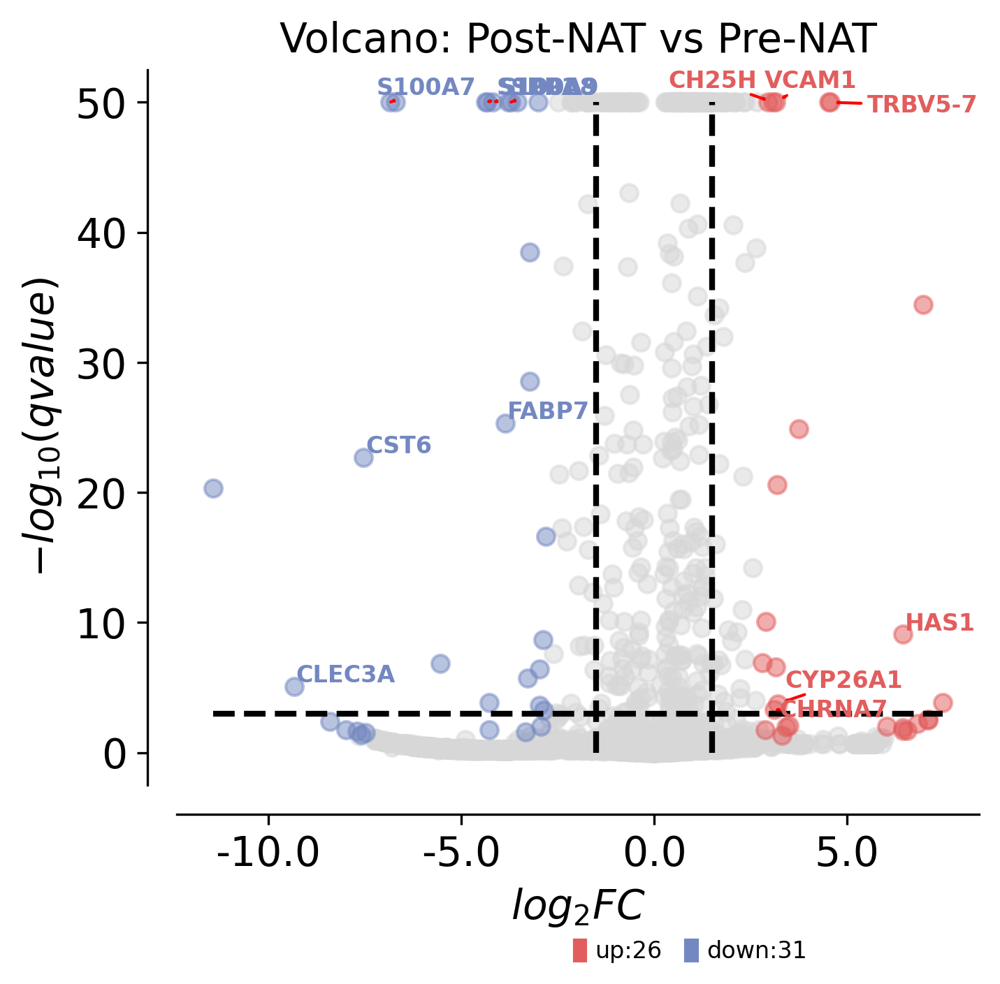

In [21]:
import numpy as np
import pandas as pd

# —— 1) 拷贝并确保基因是索引（若你的基因在第一列而非索引，解除注释下一行）
# deg_result = deg_result.set_index(deg_result.columns[0])

df = deg_result.copy()

# —— 2) 列类型转为数值；把非数字（比如 'nan' 字符串）变成 NaN
for col in ['qvalue', 'log2FC']:
    df[col] = pd.to_numeric(df[col], errors='coerce')

# —— 3) 关键：给 qvalue 设置极小正下限，避免 -log10(0) = inf
# 用 float64 能表示的最小正数；也可以改成 1e-300
# eps = np.nextafter(0, 1)
# df['qvalue'] = df['qvalue'].clip(lower=eps)
# 给 qvalue 设下限，保证 -log10(qvalue) ≤ 50
df['qvalue'] = df['qvalue'].clip(lower=10**-50)

# —— 4) 把其余无穷大/无穷小替换成 NaN，再丢弃会影响坐标的行
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df = df.dropna(subset=['qvalue', 'log2FC'])

# # —— 5) 如果还保留了你自己算的 -log 列，也把 inf 压到有限值，避免后续使用时报错
# for col in ['-log(pvalue)', '-log(qvalue)']:
#     if col in df.columns:
#         finite_mask = np.isfinite(df[col])
#         if (~finite_mask).any() and finite_mask.any():
#             df.loc[~finite_mask, col] = df.loc[finite_mask, col].max() + 1

# —— 5) 如果还保留了你自己算的 -log 列，把 inf 压到上限 50
for col in ['-log(pvalue)', '-log(qvalue)']:
    if col in df.columns:
        # 将 inf / -inf 替换为 NaN
        df[col].replace([np.inf, -np.inf], np.nan, inplace=True)
        # 再用 clip 限制最大值为 50
        df[col] = df[col].clip(upper=50)

# —— 6) 只标注“清洗后仍存在且坐标有限”的基因，避免为无效点加注释
plot_genes = []
for g in selected_genes:
    if g in df.index:
        qv = df.at[g, 'qvalue']
        fc = df.at[g, 'log2FC']
        if np.isfinite(qv) and np.isfinite(fc) and (qv > 0):
            plot_genes.append(g)

print(f"After cleaning: {df.shape[0]} rows; labeling {len(plot_genes)} genes.")

# —— 7) 正式绘图：一定要把 result=df（清洗后的表），并传入原始 qvalue
import matplotlib.pyplot as plt
import omicverse as ov

fig, ax = plt.subplots(figsize=(5, 5), dpi=150)
grp1, grp2 = 'Post-NAT', 'Pre-NAT'

ov.pl.volcano(
    result=df,
    pval_name='qvalue',      # 传原始 qvalue，函数内部会做 -log10
    fc_name='log2FC',
    pval_max=None,
    FC_max=None,
    figsize=(5, 5),
    title=f'Volcano: {grp1} vs {grp2}',
    titlefont={'weight': 'normal', 'size': 14},
    up_color='#e25d5d',
    down_color='#7388c1',
    normal_color='#d7d7d7',
    up_fontcolor='#e25d5d',
    down_fontcolor='#7388c1',
    normal_fontcolor='#d7d7d7',
    legend_bbox=(0.8, -0.2),
    legend_ncol=2,
    legend_fontsize=8,
    # 阈值
    pval_threshold=0.001,
    fc_max=1.5,               # 注意这里是 fc_max（小写）
    # 标注
    plot_genes=plot_genes,
    plot_genes_num=len(plot_genes),
    plot_genes_fontsize=8,
    ticks_fontsize=8,
    ax=ax
)

plt.tight_layout()
plt.savefig("figures/T_After_Before_DEG.svg", bbox_inches='tight')
plt.show()


#### 通路富集

In [22]:
import gseapy as gp
from gseapy import Msigdb
msig = Msigdb()
gmt = msig.get_gmt(category='mh.all', dbver="2024.1.Hs")
gmt

findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Fo

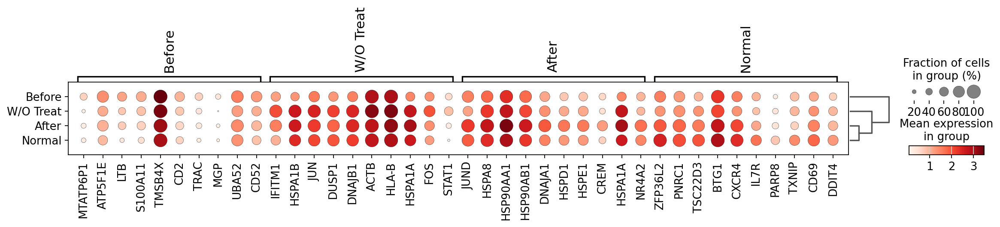

In [37]:
sc.tl.rank_genes_groups(adata_T, groupby = 'treat', method = 'wilcoxon')
sc.tl.dendrogram(adata_T, groupby='treat', use_rep='X_pca')
sc.pl.rank_genes_groups_dotplot(adata_T, groupby = 'treat', save='-T-treat.svg')

In [24]:
# get deg result
result = adata_T.uns['rank_genes_groups']
groups = result['names'].dtype.names
degs = pd.DataFrame(
    {group + '_' + key: result[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
degs

,After_names,After_scores,After_pvals,After_pvals_adj,After_logfoldchanges,Before_names,Before_scores,Before_pvals,Before_pvals_adj,Before_logfoldchanges,Normal_names,Normal_scores,Normal_pvals,Normal_pvals_adj,Normal_logfoldchanges,W/O Treat_names,W/O Treat_scores,W/O Treat_pvals,W/O Treat_pvals_adj,W/O Treat_logfoldchanges
0,JUND,72.097046,0.000000e+00,0.000000e+00,1.375283,MTATP6P1,50.220551,0.0,0.0,1.920502,ZFP36L2,39.716595,0.000000e+00,0.000000e+00,1.601927,IFITM1,71.546669,0.0,0.0,1.405639
1,HSPA8,70.349915,0.000000e+00,0.000000e+00,1.243494,ATP5F1E,49.202473,0.0,0.0,0.697635,PNRC1,35.331528,1.926951e-273,4.020872e-269,1.144749,HSPA1B,58.787025,0.0,0.0,1.558073
2,HSP90AA1,69.684433,0.000000e+00,0.000000e+00,1.274023,LTB,44.818401,0.0,0.0,1.079877,TSC22D3,33.401413,1.307801e-244,1.364462e-240,1.486849,JUN,56.707737,0.0,0.0,1.207428
3,HSP90AB1,66.104843,0.000000e+00,0.000000e+00,1.186460,S100A11,42.985390,0.0,0.0,0.811999,BTG1,33.302021,3.609714e-243,3.012884e-239,0.999825,DUSP1,56.283401,0.0,0.0,1.203410
4,DNAJA1,64.394508,0.000000e+00,0.000000e+00,1.327552,TMSB4X,42.906013,0.0,0.0,0.389846,CXCR4,29.843390,1.069568e-195,5.579533e-192,1.326768,DNAJB1,51.808231,0.0,0.0,1.116336
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41728,ACTB,-33.229462,4.042748e-242,2.279946e-239,-0.380565,HSPH1,-74.523605,0.0,0.0,-1.564992,PSMB9,-27.922951,1.404847e-171,5.862850e-168,-1.575836,MTATP6P1,-39.025589,0.0,0.0,-1.837574
41729,PSMB9,-33.311047,2.671461e-243,1.570255e-240,-0.791623,HSPA8,-75.543259,0.0,0.0,-1.104288,ISG15,-28.450817,4.760884e-178,2.207622e-174,-2.399787,EIF1,-40.377853,0.0,0.0,-0.453510
41730,CD2,-34.109829,5.273947e-255,3.285039e-252,-0.941937,DNAJB1,-79.887482,0.0,0.0,-1.541208,B2M,-30.682192,9.836758e-207,5.864535e-203,-0.425849,CALM1,-42.466354,0.0,0.0,-0.615685
41731,SH3BGRL3,-34.377754,5.421863e-259,3.428342e-256,-0.525787,HSPA1A,-92.248543,0.0,0.0,-2.277665,HLA-A,-32.776852,1.258720e-235,8.755025e-232,-0.692022,TPT1,-48.725109,0.0,0.0,-0.549574


In [25]:
# subset up or down regulated genes
degs_sig = degs[degs.After_pvals_adj < 0.05]
degs_up = degs_sig[degs_sig.After_logfoldchanges > 0]
degs_dw = degs_sig[degs_sig.After_logfoldchanges < 0]

In [7]:
degs_up

,After_names,After_scores,After_pvals,After_pvals_adj,After_logfoldchanges,Before_names,Before_scores,Before_pvals,Before_pvals_adj,Before_logfoldchanges,Normal_names,Normal_scores,Normal_pvals,Normal_pvals_adj,Normal_logfoldchanges,W/O Treat_names,W/O Treat_scores,W/O Treat_pvals,W/O Treat_pvals_adj,W/O Treat_logfoldchanges
0,JUND,72.097046,0.000000,0.000000,1.375283,MTATP6P1,50.220551,0.000000e+00,0.000000e+00,1.920502,ZFP36L2,39.716595,0.000000e+00,0.000000e+00,1.601927,IFITM1,71.546669,0.000000e+00,0.000000e+00,1.405639
1,HSPA8,70.349915,0.000000,0.000000,1.243494,ATP5F1E,49.202473,0.000000e+00,0.000000e+00,0.697635,PNRC1,35.331528,1.926951e-273,4.020872e-269,1.144749,HSPA1B,58.787025,0.000000e+00,0.000000e+00,1.558073
2,HSP90AA1,69.684433,0.000000,0.000000,1.274023,LTB,44.818401,0.000000e+00,0.000000e+00,1.079877,TSC22D3,33.401413,1.307801e-244,1.364462e-240,1.486849,JUN,56.707737,0.000000e+00,0.000000e+00,1.207428
3,HSP90AB1,66.104843,0.000000,0.000000,1.186460,S100A11,42.985390,0.000000e+00,0.000000e+00,0.811999,BTG1,33.302021,3.609714e-243,3.012884e-239,0.999825,DUSP1,56.283401,0.000000e+00,0.000000e+00,1.203410
4,DNAJA1,64.394508,0.000000,0.000000,1.327552,TMSB4X,42.906013,0.000000e+00,0.000000e+00,0.389846,CXCR4,29.843390,1.069568e-195,5.579533e-192,1.326768,DNAJB1,51.808231,0.000000e+00,0.000000e+00,1.116336
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2737,RHEBL1,2.889506,0.003858,0.049198,0.892820,TEX264,1.667999,9.531600e-02,7.958829e-01,0.152523,ENSG00000275457,0.146999,8.831324e-01,1.000000e+00,0.498958,ENSG00000285091,0.321832,7.475802e-01,1.000000e+00,0.970257
2739,PPIL3,2.887000,0.003889,0.049546,0.136599,NFRKB,1.662555,9.640165e-02,8.035715e-01,0.400583,ACBD4,0.146811,8.832809e-01,1.000000e+00,0.408672,ENSG00000257550,0.321334,7.479573e-01,1.000000e+00,0.600198
2740,ZC3H12C,2.885931,0.003903,0.049700,1.203784,UBE2K,1.662512,9.641010e-02,8.035715e-01,0.190727,PRSS3,0.146744,8.833344e-01,1.000000e+00,2.476239,ARRDC3-AS1,0.321226,7.480391e-01,1.000000e+00,0.561108
2741,GCLM,2.884506,0.003920,0.049910,0.176369,RWDD2B,1.661853,9.654234e-02,8.044743e-01,0.719519,MED8-AS1,0.146724,8.833497e-01,1.000000e+00,2.350206,CLNK,0.321079,7.481507e-01,1.000000e+00,0.115479


In [26]:
enr_up = gp.enrichr(degs_up.After_names,
                    gene_sets='KEGG_2021_Human',
                    outdir=None)
cc_up = gp.enrichr(degs_up.After_names,
                    gene_sets='GO_Cellular_Component_2023',
                    outdir=None)
bp_up = gp.enrichr(degs_up.After_names,
                    gene_sets='GO_Biological_Process_2023',
                    outdir=None)
mf_up = gp.enrichr(degs_up.After_names,
                    gene_sets='GO_Molecular_Function_2023',
                    outdir=None)
hm_up = gp.enrichr(degs_up.After_names,
                    gene_sets='MSigDB_Hallmark_2020',
                    outdir=None)

In [9]:
enr_down = gp.enrichr(degs_dw.After_names,
                    gene_sets='KEGG_2021_Human',
                    outdir=None)
cc_down = gp.enrichr(degs_dw.After_names,
                    gene_sets='GO_Cellular_Component_2023',
                    outdir=None)
bp_down = gp.enrichr(degs_dw.After_names,
                    gene_sets='GO_Biological_Process_2023',
                    outdir=None)
mf_down = gp.enrichr(degs_dw.After_names,
                    gene_sets='GO_Molecular_Function_2023',
                    outdir=None)
hm_down = gp.enrichr(degs_dw.After_names,
                    gene_sets='MSigDB_Hallmark_2020',
                    outdir=None)

In [27]:
import re, numpy as np, pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Rectangle, PathPatch
from matplotlib.path import Path
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import gseapy as gp

# ---------- helpers ----------
def parse_overlap(s):
    m = re.match(r'^\s*(\d+)\s*/\s*(\d+)\s*$', str(s))
    if not m: return np.nan, np.nan, np.nan
    x, y = int(m.group(1)), int(m.group(2))
    return x, y, (x/y if y else np.nan)

def std_enrich_cols(df):
    cols = {c.lower().replace(' ','').replace('-',''): c for c in df.columns}
    def get(k): return cols.get(k.lower().replace(' ','').replace('-',''), k)
    return df.rename(columns={
        get('Term'):'Term',
        get('Overlap'):'Overlap',
        get('P-value'):'P-value',
        get('Adjusted P-value'):'Adjusted P-value',
        get('Genes'):'Genes',
        get('Combined Score'):'Combined Score'
    })

def topk(df, k=5):
    d = df.replace([np.inf, -np.inf], np.nan).dropna(subset=['Adjusted P-value']).copy()
    d = d.sort_values('Adjusted P-value').head(k).reset_index(drop=True)
    xy = d['Overlap'].map(parse_overlap).apply(pd.Series)
    xy.columns = ['HitCount', 'GeneSetSize', 'GeneRatio']
    d = pd.concat([d, xy], axis=1)
    d['HitCount'] = d['HitCount'].fillna(0).astype(int)
    d['GeneRatio'] = d['GeneRatio'].astype(float)
    d['neglog10P'] = -np.log10(d['P-value'].clip(lower=1e-300))
    d['neglog10Padj'] = -np.log10(d['Adjusted P-value'].clip(lower=1e-300))
    d['Term_clean'] = d['Term'].astype(str)
    return d

def split_genes(s):
    return [x.strip().upper() for x in re.split(r'[;,/]', str(s)) if x.strip()]

def pick_rep_genes(all_genes_in_term, allowed_pool, logfc_map, n=8):
    genes = [g for g in all_genes_in_term if g in allowed_pool]
    genes = sorted(genes, key=lambda g: abs(logfc_map.get(g, 0)), reverse=True)
    return genes[:n]

def spaced_positions(n, top_padding=0.02, bottom_padding=0.02):
    if n <= 1: return [0.5]
    span = 1.0 - top_padding - bottom_padding
    return list(np.linspace(top_padding, top_padding+span, n))

# ---------- main ----------
def plot_sankey_bubble_sns(
    degs_up, degs,
    gene_sets='MSigDB_Hallmark_2020',
    TOP_K=8,              # 选取 -log10(Adjusted P-value) 最大的前 K 个通路
    N_REP=8,
    # 气泡大小缩放：作用在 HitCount 上
    BUBBLE_SIZE_SCALE=0.6,
    GENE_COLORMAP='tab20',
    PATH_COLORMAP='Set2',
    svg_path='overlapped_genes.svg',
    figsize=(10,8),
    font_family='Noto Sans CJK SC',
    # Sankey 样式
    EDGE_LW=3.0, EDGE_ALPHA=0.45, CURV=0.35,
    GENE_NODE_W=0.030, GENE_NODE_H=0.020,
    PATH_NODE_W=0.050, PATH_NODE_H=0.028,
    GAP_TEXT2PATH=0.010,
    # 子图间距与贴边控制
    GRID_WSPACE=0.01,          # 两子图基础间距（越小越靠近）
    BUBBLE_SHIFT_LEFT=0.035,   # 再把气泡图整体向左平移（越大越贴近色块）
    # 颜色条细条设置
    CBAR_WIDTH="3%", CBAR_HEIGHT="70%"
):
    # ----- inputs -----
    if 'After_names' not in degs_up.columns:
        raise ValueError("需要 degs_up['After_names'] 作为上调基因列表。")
    if not {'After_names','After_logfoldchanges'} <= set(degs.columns):
        raise ValueError("需要 degs['After_names','After_logfoldchanges']。")

    up_genes = (degs_up['After_names'].astype(str).str.upper().dropna().unique().tolist())
    logfc_map = (degs[['After_names','After_logfoldchanges']]
                 .dropna()
                 .assign(After_names=lambda d: d['After_names'].astype(str).str.upper())
                 .drop_duplicates('After_names')
                 .set_index('After_names')['After_logfoldchanges']
                 .to_dict())

    # ----- enrichment (up only) -----
    enr_up = gp.enrichr(degs_up.After_names, gene_sets=gene_sets, outdir=None)
    res_up = std_enrich_cols(enr_up.results.copy())

    # 计算排序所需统计量
    d = res_up.replace([np.inf, -np.inf], np.nan).dropna(subset=['Adjusted P-value']).copy()
    # 统一解析 overlap、补充列
    xy = d['Overlap'].map(parse_overlap).apply(pd.Series)
    xy.columns = ['HitCount', 'GeneSetSize', 'GeneRatio']
    d = pd.concat([d, xy], axis=1)
    d['HitCount'] = d['HitCount'].fillna(0).astype(int)
    d['GeneRatio'] = d['GeneRatio'].astype(float)
    d['neglog10P'] = -np.log10(d['P-value'].clip(lower=1e-300))
    d['neglog10Padj'] = -np.log10(d['Adjusted P-value'].clip(lower=1e-300))
    d['Term_clean'] = d['Term'].astype(str)

    # **严格按 -log10(Adjusted P-value) 排序并取前 K 个**
    top_up = (d.sort_values(['neglog10Padj', 'neglog10P'], ascending=[False, False])
                .head(int(TOP_K))
                .reset_index(drop=True))

    path_order = top_up['Term_clean'].tolist()

    # 气泡数据（保持与通路顺序一致）
    bub = (top_up.set_index('Term_clean').loc[path_order].reset_index())

    # ----- rep genes & sankey edges -----
    top_up2 = top_up.copy()
    top_up2['RepGenes'] = top_up2['Genes'].apply(split_genes).apply(
        lambda gl: pick_rep_genes(gl, set(up_genes), logfc_map, n=N_REP)
    )
    top_up2 = (top_up2.set_index('Term_clean').loc[path_order].reset_index())

    gene_nodes = sorted(set(g for lst in top_up2['RepGenes'] for g in lst))
    path_nodes = path_order[:]
    edges = [(g, p) for _, r in top_up2.iterrows() for g in r['RepGenes'] for p in [r['Term_clean']]]

    # ----- colors -----
    cmap_gene = mpl.cm.get_cmap(GENE_COLORMAP, max(len(gene_nodes), 1))
    cmap_path = mpl.cm.get_cmap(PATH_COLORMAP, max(len(path_nodes), 1))
    node_color_map = {g: cmap_gene(i) for i, g in enumerate(gene_nodes)}
    node_color_map.update({p: cmap_path(i) for i, p in enumerate(path_nodes)})

    # ----- fixed node positions -----
    y_genes = spaced_positions(len(gene_nodes))
    y_paths = spaced_positions(len(path_nodes))
    x_left, x_right = 0.06, 0.94
    x_block_left = x_right - PATH_NODE_W
    pos_gene = {g: (x_left, y_genes[i]) for i, g in enumerate(gene_nodes)}
    pos_path = {p: (x_block_left, y_paths[i]) for i, p in enumerate(path_nodes)}

    # ----- figure -----
    mpl.rcParams['font.family'] = font_family
    fig = plt.figure(figsize=figsize)
    gs = fig.add_gridspec(ncols=2, nrows=1, width_ratios=[0.68, 0.32], wspace=GRID_WSPACE)
    ax_sankey = fig.add_subplot(gs[0,0])
    ax_bubble = fig.add_subplot(gs[0,1])

    # ===== Left: Sankey =====
    ax_sankey.set_xlim(0, 1)
    ax_sankey.set_ylim(0, 1)
    ax_sankey.axis('off')

    # gene nodes & labels
    for g in gene_nodes:
        x, y = pos_gene[g]
        ax_sankey.add_patch(Rectangle((x, y - GENE_NODE_H/2), GENE_NODE_W, GENE_NODE_H,
                                      facecolor=node_color_map[g],
                                      edgecolor=(0,0,0,0.35), lw=0.6))
        ax_sankey.text(x - 0.012, y, g, va='center', ha='right', fontsize=9)

    # path nodes: 文本在左、色块在右
    for p in path_nodes:
        xb, y = pos_path[p]
        ax_sankey.text(xb - GAP_TEXT2PATH, y, p, va='center', ha='right', fontsize=10)
        ax_sankey.add_patch(Rectangle((xb, y - PATH_NODE_H/2), PATH_NODE_W, PATH_NODE_H,
                                      facecolor=node_color_map[p],
                                      edgecolor=(0,0,0,0.35), lw=0.6))

    # edges (贝塞尔曲线)
    def bezier(x0, y0, x1, y1, curv=CURV):
        cx0, cy0 = x0 + curv*(x1 - x0), y0
        cx1, cy1 = x1 - curv*(x1 - x0), y1
        verts = [(x0, y0), (cx0, cy0), (cx1, cy1), (x1, y1)]
        codes = [Path.MOVETO, Path.CURVE4, Path.CURVE4, Path.CURVE4]
        return Path(verts, codes)
    for (g, p) in edges:
        x0, y0 = pos_gene[g][0] + GENE_NODE_W, pos_gene[g][1]
        x1, y1 = pos_path[p][0], pos_path[p][1]
        ax_sankey.add_patch(PathPatch(bezier(x0, y0, x1, y1),
                                      facecolor='none',
                                      edgecolor=(0.6,0.6,0.6,EDGE_ALPHA),
                                      lw=EDGE_LW, capstyle='round'))

    # ===== Right: Bubble =====
    # X = GeneRatio；颜色 = -log10(Adjusted P-value)；大小 = HitCount
    with sns.axes_style("whitegrid"):
        sizes_px = (bub["HitCount"].fillna(0).astype(float) * (40 * BUBBLE_SIZE_SCALE) + 20)
        sc = ax_bubble.scatter(
            bub["GeneRatio"], bub["Term_clean"],
            s=sizes_px,
            c=bub["neglog10Padj"],       # 用调整后 P 值着色
            cmap="Reds",
            edgecolors="k", linewidths=0.4, alpha=0.9
        )

    # 将右图往左“贴”到色块边上
    pos = ax_bubble.get_position()
    ax_bubble.set_position([pos.x0 - BUBBLE_SHIFT_LEFT, pos.y0, pos.width, pos.height])

    # 隐藏 y 标签与刻度（共用左侧通路名）
    ax_bubble.set_ylabel("")
    ax_bubble.set_yticklabels([])
    ax_bubble.tick_params(axis='y', length=0)

    ax_bubble.set_xlabel("Gene Ratio")
    ax_bubble.grid(True, alpha=0.3, linewidth=0.6)

    # 颜色条（瘦长、在右侧）
    norm = mpl.colors.Normalize(vmin=bub["neglog10Padj"].min(), vmax=bub["neglog10Padj"].max())
    mappable = mpl.cm.ScalarMappable(norm=norm, cmap="Reds")
    cb_ax = inset_axes(ax_bubble, width=CBAR_WIDTH, height=CBAR_HEIGHT, loc="center right",
                       bbox_to_anchor=(0.10, 0., 1, 1), bbox_transform=ax_bubble.transAxes,
                       borderpad=0)
    cbar = plt.colorbar(mappable, cax=cb_ax)
    cbar.set_label("-Log10(Adjusted P-value)")
    cbar.ax.tick_params(labelsize=9)

    plt.tight_layout()
    fig.savefig(svg_path, format="svg", dpi=300)
    plt.close(fig)
    return svg_path


In [28]:
# 假设你已有 degs_up, degs 两个 DataFrame
out = plot_sankey_bubble_sns(
    degs_up, degs,
    gene_sets='MSigDB_Hallmark_2020',
    N_REP=8,
    BUBBLE_SIZE_SCALE=0.1,
    GENE_COLORMAP='tab20',
    PATH_COLORMAP='Set3',
    svg_path='figures/T-after-upgrades-Hallmark.svg'   # 输出文件名
)

findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Fo

findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Font family 'Noto Sans CJK SC' not found.
findfont: Fo

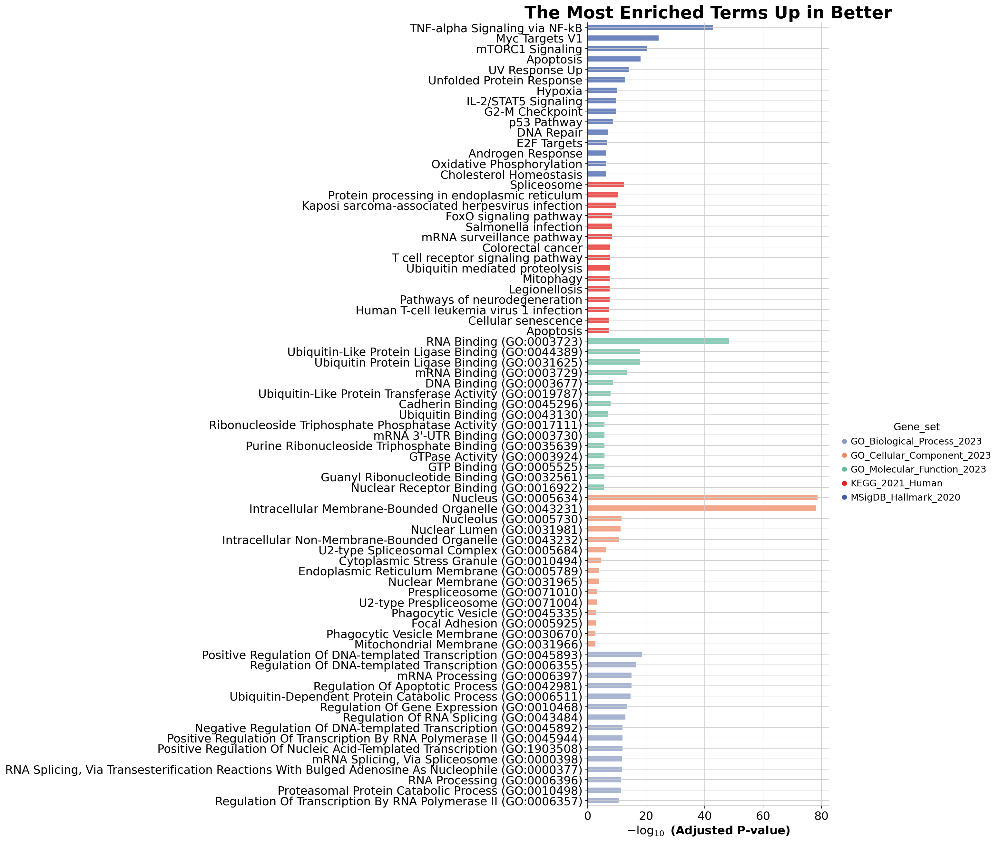

In [26]:
go_res = pd.concat([enr_up.res2d.head(15),hm_up.res2d.head(15), cc_up.res2d.head(15), bp_up.res2d.head(15), mf_up.res2d.head(15)])
ax = gp.barplot(go_res, figsize=(6,20),
                group ='Gene_set',
                top_term=15,
                color = ['#8b9cc4', '#f08961', '#62bb9f', '#e71f19', '#3d5eaa'],
                title ="The Most Enriched Terms Up in Better")
ax.figure.savefig(f"figures/T_After_Enrichment_UP.svg")

#### 轨迹分析

In [27]:
adata_CD8T.obs['anno-subT']

barcodes
AAAGAACCACCTGAAT-1-1T     T07_Tn/Tcm_CD8
AAAGAACCAGCTGAAG-1-1T     T07_Tn/Tcm_CD8
AAAGAACGTTGTGTTG-1-1T      T10_pTex_IFNG
AAATGGAAGTAAACGT-1-1T     T07_Tn/Tcm_CD8
AAATGGATCGCTGATA-1-1T     T07_Tn/Tcm_CD8
                               ...      
TTTGGTTCAATCGGTT-1-22T          T09_XCL1
TTTGGTTTCGTAGGAG-1-22T     T08_Teff_GZMK
TTTGTCAAGAAAGTGG-1-22T    T11_tTex_early
TTTGTCAAGGAACTGC-1-22T     T12_tTex_late
TTTGTCACATGACGGA-1-22T     T10_pTex_IFNG
Name: anno-subT, Length: 19922, dtype: category
Categories (8, object): ['NKT_FGFBP2', 'NK_NCAM1', 'T07_Tn/Tcm_CD8', 'T08_Teff_GZMK', 'T09_XCL1', 'T10_pTex_IFNG', 'T11_tTex_early', 'T12_tTex_late']

In [47]:
# 筛选掉T11_tTex_early和T12_tTex_late，保留其他细胞
adata_filter = adata_CD8T[~adata_CD8T.obs['anno-subT'].isin(['NK_NCAM1', 'NKT_FGFBP2']), :].copy()

In [ ]:
# adata_filter = adata_filter[~adata_filter.obs['batch'].isin(['16T']), :]

2025-09-17 09:38:55,603 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


Ignoring processing doublet cells...


2025-09-17 09:38:58,305 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-09-17 09:38:58,372 - harmonypy - INFO - Iteration 1 of 20
2025-09-17 09:39:01,352 - harmonypy - INFO - Iteration 2 of 20
2025-09-17 09:39:04,106 - harmonypy - INFO - Converged after 2 iterations


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

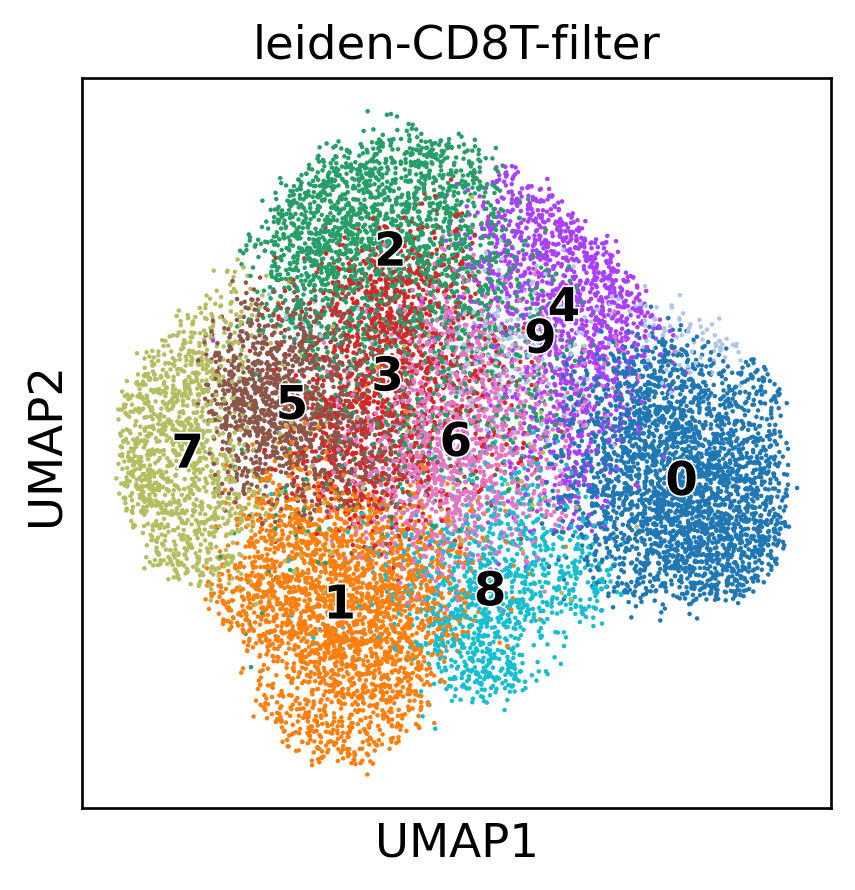

In [48]:
adata_filter = clu(adata_filter, key_added='leiden-CD8T-filter', do_har=True)

In [49]:
Traj=ov.single.TrajInfer(adata_filter,basis='X_umap',groupby='treat',
                         use_rep='X_pca_harmony',n_comps=50,)
Traj.set_origin_cells('Before')
Traj.inference(method='diffusion_map')

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

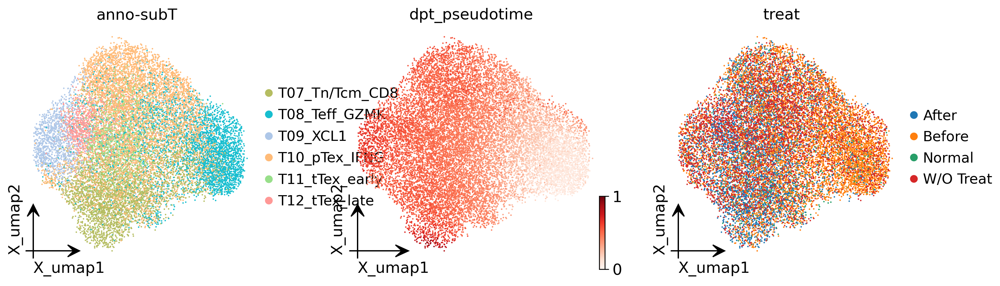

In [50]:
ov.utils.embedding(adata_filter,basis='X_umap',
                   color=['anno-subT','dpt_pseudotime', 'treat'],
                   frameon='small',cmap='Reds')

In [ ]:
import pyVIA.core as via
#set parameters for Via 2.0
memory=100 #this is a high memory value and will result in probabilistic pathways that avoid transitioning into unrelated cell populations 
cluster_graph_pruning = 0.15 #level of pruning done on the cluster graph. higher number means less pruning (values can range from 0-3 standard deviations)
edgepruning_clustering_resolution = 0.15  # regulates number of clusters. Higher values means fewer clusters (values can range from 0-3 standard deviations)
random_seed = 42 
knn = 30  # number of neighbors in the knn graph
knn_sequential = 15  # number of neighbors additionally created between sequentially adjacent time points 
n_pcs = 15 # number of principal components
velo_weight = 0  # 0.7 #weight given to velocity based direction compared to pseudotime based direction
t_diff_step = 1 #edges extending between nodes that are more than 2 time steps apart will be removed (i.e. equal to 3 or more time steps apart)
root = ['Before'] #for reproducibility, we set the root here. the group level root assignment must correspond to a label that exists in the True-label parameter (must be passed inside a list). For autodetection based on rna-velocity it can be left as None. A single cell index can also be passed e.g. [256], means the 256th cell will be used as a root. Since we will be using the velocity matrices (see below), Via 2.0 will suggest a list of likely root cell states that the user can decide to choose between. It is helpful to examine the top 5 suggested roots and choose the one that seems most reasonable. Note in the output that Via 2.0's suggestions are almost all in the epibliast or Primitive streak state 
neighboring_terminal_states_threshold = 4
max_visual_outgoing_edges = 10#5 #used in differentiation flow chart plots
time_series = True
parc_numeric_cluster_labels = [i for i in adata_filter.obs['leiden-CD8T-filter']]
cluster_celltype_label = [i for i in adata_filter.obs['treat']]
use_velocity = False
velo_weight = 0.5

if use_velocity:
    gene_matrix =np.asmatrix(adata_filter.layers['Ms'])
    velocity_matrix = np.asmatrix(adata_filter.layers['velocity'])
    velo_weight=velo_weight
else: 
    gene_matrix =None
    velocity_matrix = None
    velo_weight=0
v0 = via.VIA(adata_filter.obsm['X_pca_harmony'][:, 0:n_pcs], true_label = cluster_celltype_label,
        edgepruning_clustering_resolution=edgepruning_clustering_resolution,
        edgepruning_clustering_resolution_local=1, knn=knn, memory=memory,
        root_user=root, random_seed=random_seed, dataset='group',
        knn_sequential_reverse=knn_sequential,
        )

In [51]:
from datetime import datetime
print(f'{datetime.now()}\tRun Via2.0')
v0.run_VIA()
print(f'{datetime.now()}\tEnd Via2.0 computation')

2025-09-17 09:45:42.358972	Run Via2.0
2025-09-17 09:45:42.359048	Running VIA over input data of 14396 (samples) x 15 (features)
2025-09-17 09:45:42.359075	Knngraph has 30 neighbors
2025-09-17 09:45:46.221124	Finished global pruning of 30-knn graph used for clustering at level of 0.15. Kept 48.5 % of edges. 
2025-09-17 09:45:46.294234	Number of connected components used for clustergraph  is 1
2025-09-17 09:45:46.951334	Using predfined labels provided by user (this must be provided as an array)
2025-09-17 09:45:46.951439	Making cluster graph. Global cluster graph pruning level: 0.15
2025-09-17 09:45:46.989153	Graph has 1 connected components before pruning
2025-09-17 09:45:46.990858	Graph has 1 connected components after pruning
2025-09-17 09:45:46.991033	Graph has 1 connected components after reconnecting
2025-09-17 09:45:46.991600	0.0% links trimmed from local pruning relative to start
2025-09-17 09:45:46.991621	58.7% links trimmed from global pruning relative to start
initial links 20

/home/hanxue/miniconda3/envs/omicverse/lib/python3.10/site-packages/phate/__init__.py
/home/hanxue/miniconda3/envs/omicverse/lib/python3.10/site-packages/phate/__init__.py
2025-09-17 09:45:59.806474	Ended all multiprocesses, will retrieve and reshape
2025-09-17 09:45:59.830104	start computing walks with rw2 method


  0%|          | 0/1300 [00:00<?, ?it/s]

memory for rw2 hittings times  2. Using rw2 based pt
2025-09-17 09:46:03.376839	Identifying terminal clusters corresponding to unique lineages...
2025-09-17 09:46:03.376864	Closeness:[0, 1, 3, 12, 13, 14]
2025-09-17 09:46:03.376875	Betweenness:[0, 1, 3, 6, 7, 8, 12, 13, 14]
2025-09-17 09:46:03.376883	Out Degree:[0, 1, 2, 3, 4, 11, 12, 13, 14]
2025-09-17 09:46:03.377080	Cluster 3 had 3 or more neighboring terminal states [0, 12, 14] and so we removed cluster 0
2025-09-17 09:46:03.377112	Cluster 13 had 3 or more neighboring terminal states [1, 12, 14] and so we removed cluster 1
2025-09-17 09:46:03.377239	Terminal clusters corresponding to unique lineages in this component are [3, 12, 13, 14] 
2025-09-17 09:46:03.377257	Calculating lineage probability at memory 100


  0%|          | 0/1000 [00:00<?, ?it/s]

2025-09-17 09:46:06.838633	Cluster or terminal cell fate 3 is reached 737.0 times
2025-09-17 09:46:06.865565	Cluster or terminal cell fate 12 is reached 606.0 times
2025-09-17 09:46:06.890470	Cluster or terminal cell fate 13 is reached 902.0 times
2025-09-17 09:46:06.916829	Cluster or terminal cell fate 14 is reached 396.0 times
2025-09-17 09:46:06.931541	There are (4) terminal clusters corresponding to unique lineages {3: 'T10_pTex_IFNG', 12: 'T08_Teff_GZMK', 13: 'T08_Teff_GZMK', 14: 'T12_tTex_late'}
2025-09-17 09:46:06.931579	Begin projection of pseudotime and lineage likelihood


TypeError: only integer scalar arrays can be converted to a scalar index

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


2025-09-17 09:34:46.422989	Plot Via2.0 cluster graph
tune edges False


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

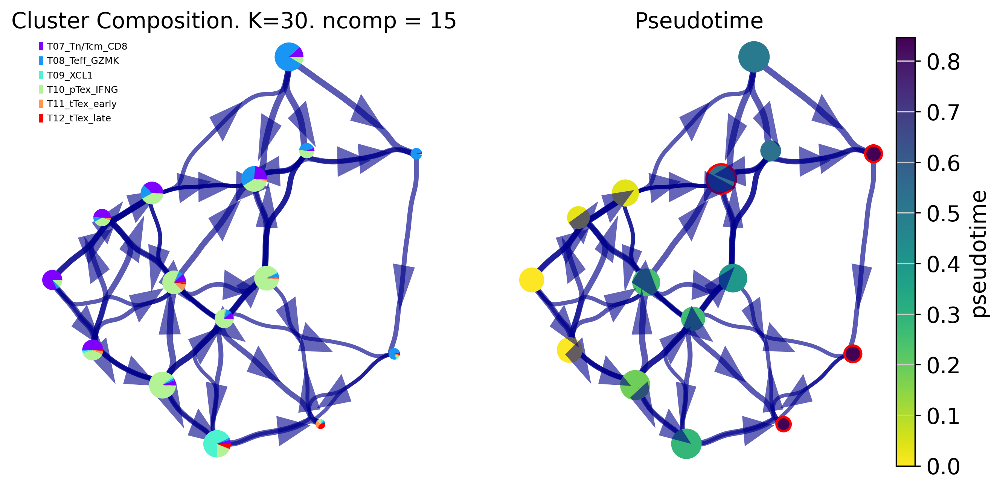

In [ ]:
print(f'{datetime.now()}\tPlot Via2.0 cluster graph')
age_label = [i for i in adata_filter.obs['anno-subT']]
f, ax, ax1=via.plot_piechart_viagraph(via_object=v0, headwidth_arrow=0.2, show_legend=True, ax_text=False, pie_size_scale=0.6, cmap_piechart='rainbow', 
                        highlight_terminal_clusters=True, size_node_notpiechart=0.8)
f.set_size_inches(10, 5)
f.savefig(f'figures/CD8T-trajectory-include16T.svg')

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


2025-09-17 09:35:11.773839	Start Atlas embedding computation
2025-09-17 09:35:11.774346	Plot Atlas Embedding


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

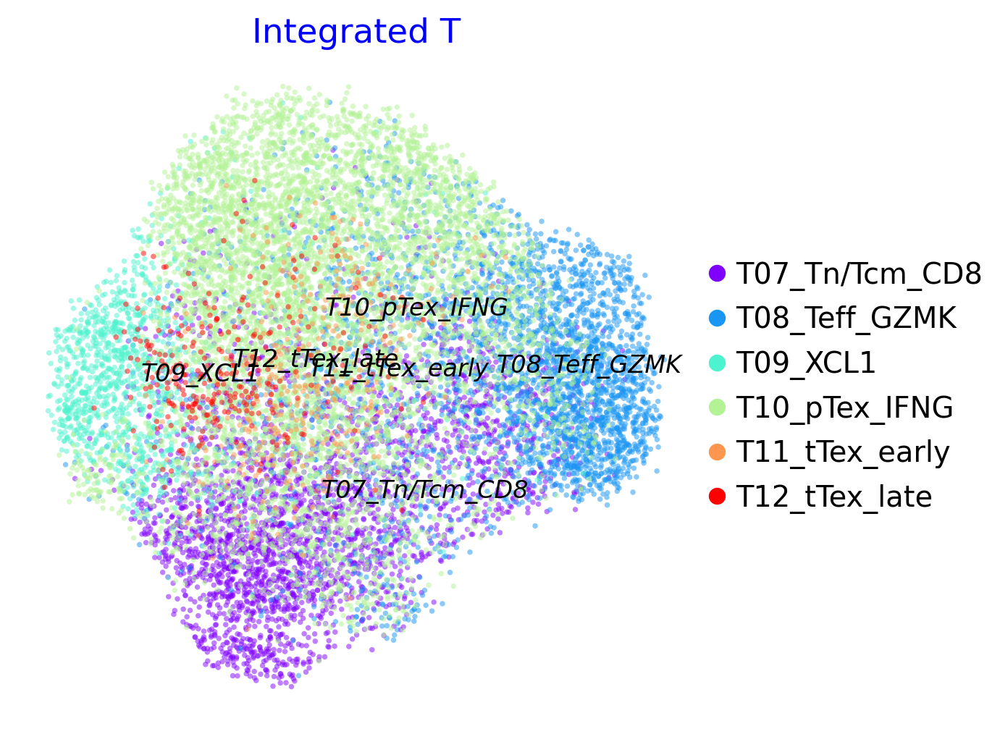

In [ ]:
print(f'{datetime.now()}\tStart Atlas embedding computation')
atlas_embedding = adata_filter.obsm['X_umap']
print(f'{datetime.now()}\tPlot Atlas Embedding')
f2, ax = via.plot_scatter(embedding=atlas_embedding, labels=cluster_celltype_label, title='Integrated T',
                          alpha=0.5, s=5)
f2.set_size_inches(5, 5)
f2.savefig("figures/CD8T_umap-include16T.svg")

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

head df full          pt        celltype
0  0.501079  T07_Tn/Tcm_CD8
1  0.346261  T07_Tn/Tcm_CD8
2  0.399288   T10_pTex_IFNG
3  0.527613  T07_Tn/Tcm_CD8
4  0.540880  T07_Tn/Tcm_CD8
dict temp Counter({'T07_Tn/Tcm_CD8': 0.5902663597500822, 'T10_pTex_IFNG': 0.29200920749753373, 'T08_Teff_GZMK': 0.08122328181519237, 'T11_tTex_early': 0.021703387043735613, 'T09_XCL1': 0.01183821111476488, 'T12_tTex_late': 0.00295955277869122})
dict temp Counter({'T10_pTex_IFNG': 0.41533546325878595, 'T07_Tn/Tcm_CD8': 0.3993610223642173, 'T09_XCL1': 0.08306709265175719, 'T11_tTex_early': 0.06070287539936102, 'T08_Teff_GZMK': 0.025559105431309903, 'T12_tTex_late': 0.01597444089456869})
dict temp Counter({'T10_pTex_IFNG': 0.5896656534954408, 'T07_Tn/Tcm_CD8': 0.2735562310030395, 'T08_Teff_GZMK': 0.05167173252279635, 'T11_tTex_early': 0.04559270516717325, 'T09_XCL1': 0.0364741641337386, 'T12_tTex_late': 0.00303951367781155})
dict temp Counter({'T10_pTex_IFNG': 0.7611510791366907, 'T07_Tn/Tcm_CD8': 0.12086330935

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

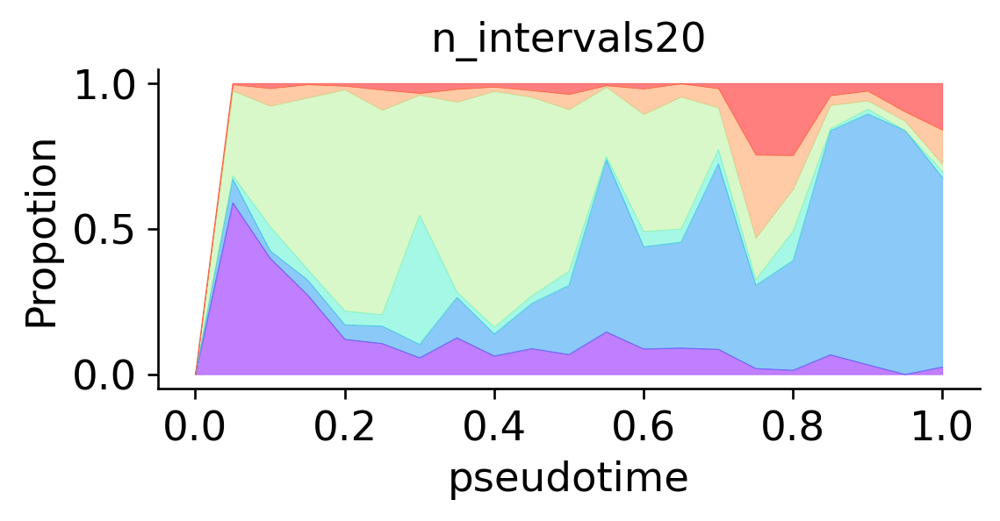

In [ ]:
ax = via.plot_population_composition(v0, xlabel='pseudotime', ylabel='Propotion', legend=False,  title='', cmap='rainbow', n_intervals=20)
ax.figure.set_size_inches(5, 2)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.figure.savefig('figures/CD8T-pseudotime-include16T.svg')

#### 

#### 基因轨迹

In [3]:
from gene_trajectory.add_gene_bin_score import add_gene_bin_score
from gene_trajectory.coarse_grain import select_top_genes, coarse_grain_adata
from gene_trajectory.extract_gene_trajectory import get_gene_embedding, extract_gene_trajectory
from gene_trajectory.get_graph_distance import get_graph_distance
from gene_trajectory.gene_distance_shared import cal_ot_mat
from gene_trajectory.run_dm import run_dm
from gene_trajectory.plot.gene_trajectory_plots import plot_gene_trajectory_3d, plot_gene_trajectory_umap, plot_gene_trajectory_2d
from gene_trajectory.util.download_file import download_file_if_missing

In [4]:
from datetime import datetime

def timeprint(string):
  print(f"[{datetime.now().strftime('%Y-%m-%d %H:%M:%S')}] {string}")

def run_gene_trajectory(adata, add_genes=[]):
  timeprint("Start running gene trajectory...")
  genes = select_top_genes(adata, layer='Raw', n_variable_genes=500)
  timeprint(f"Found {len(genes)} highly variable genes.")
  genes = list(genes)
  genes.extend(add_genes)
  genes = np.unique(genes)
  run_dm(adata)
  timeprint("Running Cell graph...")
  cell_graph_dist = get_graph_distance(adata, k=10)
  gene_expression_updated, graph_dist_updated = coarse_grain_adata(adata, graph_dist=cell_graph_dist, features=genes, n=500)
  timeprint("Evaluating gene distance...")
  gene_dist_mat = cal_ot_mat(gene_expr=gene_expression_updated, 
                           ot_cost=graph_dist_updated, 
                           show_progress_bar=True)
  timeprint("Generating gene distance...")
  gene_embedding, _ = get_gene_embedding(gene_dist_mat, k = 5)
  timeprint("Generating gene_trajectory...")
  gene_trajectory = extract_gene_trajectory(gene_embedding, gene_dist_mat, t_list = [4, 8, 7], gene_names=genes, k=5)
  return gene_trajectory

def refine_gene_trajectory(adata, genes):
  timeprint("Running Cell graph...")
  cell_graph_dist = get_graph_distance(adata, k=10)
  gene_expression_updated, graph_dist_updated = coarse_grain_adata(adata, graph_dist=cell_graph_dist, features=genes, n=500)
  timeprint("Evaluating gene distance...")
  gene_dist_mat = cal_ot_mat(gene_expr=gene_expression_updated, 
                           ot_cost=graph_dist_updated, 
                           show_progress_bar=True)
  timeprint("Generating gene distance...")
  gene_embedding, _ = get_gene_embedding(gene_dist_mat, k = 5)
  timeprint("Generating gene_trajectory...")
  gene_trajectory = extract_gene_trajectory(gene_embedding, gene_dist_mat, t_list = [4, 8, 7], gene_names=genes, k=5)
  return gene_trajectory

In [5]:
gene_trajectory_T = run_gene_trajectory(adata_T, add_genes=['HLA-DQA1', 'SELL','CCR7','PDCD1', 'GZMK', 'ENTPD1', 'TIGIT', 'HAVCR2', 'CD200','TCF7', 'IL7R', 'ZNF683', 'LAG3', 'CTLA4', 'MSI2', 'XIST', 'CXCL13', 'DAB1', 'KSR1', 'TTN', 'TK1', 'CD38'])

[2025-09-09 05:45:15] Start running gene trajectory...


ValueError: Layer Raw not found in adata. Available []

In [4]:
import memento
import anndata as ad
import pandas as pd
def DE_memento_1d(adata: ad.AnnData, ctleft: list, ctright: list, groupby='annotation'):
  """
  使用 Memento 包分析单细胞测序数据中的动态变化。

  Args:
      adata (ad.AnnData): 单细胞测序数据的 AnnData 对象,adata.X requires raw data。
      ctleft (list): 左条件列表，表示刺激前的细胞类型或状态。
      ctright (list): 右条件列表，表示刺激后的细胞类型或状态。
      groupby (str, optional): 用于分组的注释列名。默认为 'annotation'。

  Returns:
      pd.DataFrame: Memento 分析的结果，包括差异表达分析、HT 1D moments 分析等。

  """
  _adata = adata[adata.obs[groupby].isin(ctleft + ctright)].copy()
  _adata = ad.AnnData(_adata.X, obs = _adata.obs, var = _adata.var)
  _adata.obs['stim'] = _adata.obs[groupby].isin(ctright)
  _adata.obs['stim'] = _adata.obs['stim'].astype('int')
  _adata.obs['capture_rate'] = 0.07
  memento.setup_memento(_adata, q_column='capture_rate')
  memento.create_groups(_adata, label_columns=['stim'])
  memento.compute_1d_moments(_adata, min_perc_group=.7)
  meta_df = memento.get_groups(_adata)
  meta_df['intercept'] = 1
  convariate = meta_df[['intercept']]
  treatment = (meta_df[['stim']] == 1).astype(float)
  
  memento.ht_1d_moments(_adata,
  covariate=convariate,
  treatment=treatment,
  num_cpus=16,
  resample_rep=False,
  )
  memento_results = memento.get_1d_ht_result(_adata)
  return(memento_results)

import scanpy as sc
import gseapy as gp
from gseapy import Msigdb
def prep_enrichr(adata, groupby):
  # de analysis
  sc.tl.rank_genes_groups(adata, groupby=groupby)
  sc.tl.dendrogram(adata, groupby=groupby)
  # get deg result
  result = adata.uns['rank_genes_groups']
  groups = result['names'].dtype.names
  degs = pd.DataFrame(
      {group + '_' + key: result[key][group]
      for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
  return degs

def run_enrichr_genelist(genelist):
  kegg = gp.enrichr(genelist,
                  gene_sets='KEGG_2021_Human',
                  outdir=None)
  cc = gp.enrichr(genelist,
                      gene_sets='GO_Cellular_Component_2023',
                      outdir=None)
  hm = gp.enrichr(genelist,
                      gene_sets=['MSigDB_Hallmark_2020'],
                      outdir=None)
  mf = gp.enrichr(genelist,
                      gene_sets='GO_Molecular_Function_2023',
                      outdir=None)
  bp = gp.enrichr(genelist,
                      gene_sets=['GO_Biological_Process_2023'],
                      outdir=None)
  return kegg, cc, hm, mf, bp

def run_enrichr_scanpy(degs, group,direction='up', top_term=15, all_term=False, plot=True, threshold=0.5):
  # subset up or down regulated genes
  degs_sig = degs[degs[f'{group}_pvals_adj'] < 0.05]
  degs_up = degs_sig[degs_sig[f'{group}_logfoldchanges'] > threshold]
  degs_dw = degs_sig[degs_sig[f'{group}_logfoldchanges'] < -threshold]
  degs_used = degs_up[f'{group}_names'] if direction == 'up' else degs_dw[f'{group}_names']
  kegg, cc, hm, mf, bp = run_enrichr_genelist(degs_used)
  go_res = pd.concat([kegg.res2d.head(top_term),
                    hm.res2d.head(top_term), 
                    cc.res2d.head(top_term), 
                    bp.res2d.head(top_term), 
                    mf.res2d.head(top_term)])
  if plot:
    ax = gp.barplot(go_res, figsize=(6,20),
                group ='Gene_set',
                top_term=top_term,
                color = ['#8b9cc4', '#f08961', '#62bb9f', '#e71f19', '#3d5eaa'],
                title ="The Most Enriched Terms")
  else:
    ax = None
  if all_term:
    go_res = pd.concat([kegg.res2d, hm.res2d, cc.res2d, bp.res2d, mf.res2d])
  return go_res, ax
  
def run_enrichr_memento(memento_results,direction='up', top_term=15):
  memento_sig = memento_results[memento_results['de_pval'] < 0.05]
  memento_up = memento_sig[memento_sig['de_coef'] > 0]
  memento_dw = memento_sig[memento_sig['de_coef'] < 0]
  degs_used = memento_up['gene'] if direction == 'up' else memento_dw['gene']
  kegg, cc, hm, mf, bp = run_enrichr_genelist(degs_used)
  go_res = pd.concat([kegg.res2d.head(15),
                      hm.res2d.head(15), 
                      cc.res2d.head(15), 
                      bp.res2d.head(15), 
                      mf.res2d.head(15)])
  ax = gp.barplot(go_res, figsize=(6,20),
              group ='Gene_set',
              top_term=top_term,
              color = ['#8b9cc4', '#f08961', '#62bb9f', '#e71f19', '#3d5eaa'],
              title ="The Most Enriched Terms")
  return go_res, ax

In [5]:
degs = prep_enrichr(adata_T, "anno-subT")

In [7]:
gores_list = []
# cell_types = ['After', 'Before', 'W/O Treat']
cell_types = ['T01_Tn/Tcm_CD4',
 'T07_Tn/Tcm_CD8',
 'T10_pTex_IFNG',
 'T13_cyc',
 'T02_Treg_FOXP3',
 'T04_Th2_GATA3',
 'NK_NCAM1',
 'T09_XCL1',
 'T08_Teff_GZMK',
 'T05_Tfh_BCL6',
 'T03_Th1_IFNG',
 'NKT_FGFBP2',
 'T11_tTex_early',
 'T12_tTex_late']
for ct in cell_types:
  print("Running enrichment for {}...".format(ct))
  go_res, _ = run_enrichr_scanpy(degs, ct,direction='up', top_term=15, all_term=True, plot=False)
  go_res = go_res =  go_res[['Gene_set', 'Term', 'Overlap', 'P-value', 'Adjusted P-value', 'Odds Ratio', 'Combined Score']]
  go_res['anno'] = ct
  gores_list.append(go_res)
gores = pd.concat(gores_list, axis=0, ignore_index=True)

Running enrichment for T01_Tn/Tcm_CD4...


Running enrichment for T07_Tn/Tcm_CD8...
Running enrichment for T10_pTex_IFNG...
Running enrichment for T13_cyc...
Running enrichment for T02_Treg_FOXP3...
Running enrichment for T04_Th2_GATA3...
Running enrichment for NK_NCAM1...
Running enrichment for T09_XCL1...
Running enrichment for T08_Teff_GZMK...
Running enrichment for T05_Tfh_BCL6...
Running enrichment for T03_Th1_IFNG...
Running enrichment for NKT_FGFBP2...
Running enrichment for T11_tTex_early...
Running enrichment for T12_tTex_late...


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

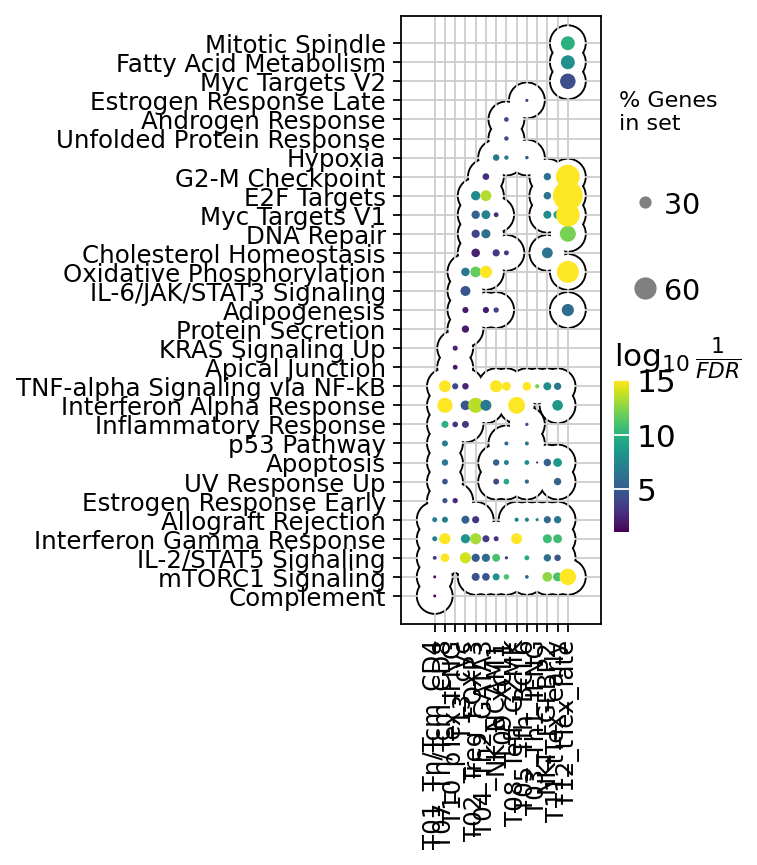

In [8]:
from gseapy.scipalette import SciPalette
sci = SciPalette()
NbDr = sci.create_colormap() 
ax = gp.dotplot(gores[gores['Gene_set'].isin(['MSigDB_Hallmark_2020'])],figsize=(2,5),
                x='anno',
                title="",
                size=2.5,
                cmap='viridis',
                top_term=10,
                show_ring=True)
ax.set_xticklabels(['T01_Tn/Tcm_CD4',
 'T07_Tn/Tcm_CD8',
 'T10_pTex_IFNG',
 'T13_cyc',
 'T02_Treg_FOXP3',
 'T04_Th2_GATA3',
 'NK_NCAM1',
 'T09_XCL1',
 'T08_Teff_GZMK',
 'T05_Tfh_BCL6',
 'T03_Th1_IFNG',
 'NKT_FGFBP2',
 'T11_tTex_early',
 'T12_tTex_late'],rotation=90, fontsize=11)
ax.set_yticklabels(ax.get_yticklabels(),rotation=0, fontsize=11)
ax.set_xlabel('')
ax.figure.savefig("figures/T_celltype_MSigDB_Hallmark_2020.svg", bbox_inches='tight')